# <font color='red'> Description du projet </font>

## <font color='blue'>Présentation du problème </font>

L’objectif de ce projet est d’estimer **les temps de réponse et de mobilisation** de la Brigade des Pompiers de Londres. La brigade des pompiers de Londres est le service d'incendie et de sauvetage le plus actif du Royaume-Uni  et l'une des plus grandes organisations de lutte contre l'incendie et de sauvetage au monde.

Le premier jeu de données fourni contient les détails de chaque incident traité depuis janvier 2009. Des informations sont fournies sur la date et le lieu de l'incident ainsi que sur le type d'incident traité. Il est composé de deux fichiers

*   LFB Incident data from 2009 - 2017.xlsx
*   LFB Incident data from 2018 onwards.csv

Le second fichier peut-être récupéré à l'aide du lien : 'https://data.london.gov.uk/download/london-fire-brigade-incident-records/f5066d66-c7a3-415f-9629-026fbda61822/LFB%20Incident%20data%20from%202018%20onwards.csv.xlsx' pour avoir la dernière version du fichier. En effet, les données sont mises à jour tous les mois. Il faut compter au moins 7 minutes pour la lecture des données.

<br>

Le second jeu de données contient les détails de chaque camion de pompiers envoyé sur les lieux d'un incident depuis janvier 2009. Des informations sont fournies sur l'appareil mobilisé, son lieu de déploiement et les heures d'arrivée sur les lieux de l'incident. Il est composé de trois fichiers

*   LFB Mobilisation data from January 2009 - 2014.xlsx
*   LFB Mobilisation data from 2015 - 2020.xlsx
*   LFB Mobilisation data from January 2009 - 2014.xlsx

Le dernier fichier peut-être récupéré à l'aide du lien : 'https://data.london.gov.uk/download/london-fire-brigade-mobilisation-records/3ff29fb5-3935-41b2-89f1-38571059237e/LFB%20Mobilisation%20data%202021%20-%202024.xlsx' pour avoir la dernière version du fichier (mise à jour mensuelle). Il faut compter environ 17 minutes pour la lecture des données.

## <font color='blue'> Etapes précédentes </font>

Dans le notebook *1 - Exploration des données*, nous avons crée un dataframe df_mobilisation_incident. Il est utilisé ici.

## <font color='blue'>Etapes dans ce notebook </font>

Voici les étapes faites dans ce notebook
*   Chargement d'un environnement de travail avec les librairies nécessaires
*   Téléchargement des données définies ci-dessus
*   Représentation graphique de la distribution des variables
*   Représentation graphique des liens pouvant exister entre les temps de réponse (`TurnoutTimeSeconds`, `TravelTimeSeconds` et `TotalResponseTime`) et les autres variables.

Pour ne pas surcharger ce notebook, la plupart des sorties graphiques n'y sont pas sauvegardées. Elles sont alors enregistrées dans le dossier [IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt) dans un fichier png ou html; ces fichiers sont numérotés par ordre d'apparition dans le notebook.

# <font color='red'>1) Préparation de l'environement de travail </font>

## <font color='blue'>Installation des modules </font>

In [ ]:
#!pip install matplotlib
#!pip install Seaborn
#!pip install openpyxl
#!pip install scipy
#!pip install geopandas
#!pip install scikit-learn
#!pip install statsmodels
#!pip install folium
#!pip install plotly
#!pip install --upgrade seaborn
#!pip install jupyter
#!pip install nbformat

## <font color='blue'>Importation des bibliothèques </font>

In [ ]:
import pandas as pd  #Pour les dataframe
import numpy as np #Pour le calcul numérique
import datetime as dt # Pour le calcul sur les dates

## Libraries pour les graphiques
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D # graphique 3D
import plotly.express as px  #graphique 3D dynamique
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as offline

## Libraries pour statistiques
# régression linéaire
import statsmodels.api as sm
from statsmodels.formula.api import ols
# tests statistiques
from scipy.stats import shapiro , kstest # tests de sur la normalité de la distributin
from scipy.stats import bartlett # tests sur les variances
from scipy.stats import kruskal #  comparaison des médianes
from scipy.stats import spearmanr
from scipy import stats # notamment pour boxplot

# Libraries divers
from copy import deepcopy  # gestion des copies




## <font color='blue'>Liaison avec le drive (pour travailler sur GoogleColab) </font>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# <font color='red'>2) Récupération des données (cf Exploration de données)</font>

Code pour travailler sur GoogleColab

In [ ]:
dfim = pd.read_csv('/content/gdrive/My Drive/1_Rendu/InitialDatasets/LFB incident et mobilisation data.csv', low_memory=False)

# modification du type pour les colonnes date
dfim.DateOfCall=pd.to_datetime(dfim.DateOfCall)
dfim.DateAndTimeMobilised=pd.to_datetime(dfim.DateAndTimeMobilised)
dfim.DateAndTimeMobile=pd.to_datetime(dfim.DateAndTimeMobile)
dfim.DateAndTimeArrived=pd.to_datetime(dfim.DateAndTimeArrived)

df_2023=dfim[dfim.CalYear==2023].copy(deep=True)

Code pour travail en local

In [ ]:
dfim = pd.read_csv('../Data/Datapreprocessing/LFB incident et mobilisation data.csv',low_memory=False)

# modification du type pour les colonnes date
dfim.DateOfCall=pd.to_datetime(dfim.DateOfCall)
dfim.DateAndTimeMobilised=pd.to_datetime(dfim.DateAndTimeMobilised)
dfim.DateAndTimeMobile=pd.to_datetime(dfim.DateAndTimeMobile)
dfim.DateAndTimeArrived=pd.to_datetime(dfim.DateAndTimeArrived)

# df_2023=dfim[dfim.CalYear==2023]

# <font color='red'> 3) Analyse des variables `TurnoutTimeSeconds`,  `TravelTimeSeconds` et `TotalResponseTime`</font>

L'objectif de notre projet est d'étudier le temps entre un appel et l'arrivée des pompiers sur site, ce qui correspond à la somme des variables `TurnoutTimeSeconds` et `TravelTimeSeconds` (soit `TotalResponseTime`). Dans cette section, nous étudions la distribution de ces trois variables.



## <font color='blue'> 3.a) Etude en fonction des années </font>


Notre jeu de données comprend des données sur 10 ans d'incidents gérés par la Brigade de Pompiers de Londres. Après nettoyage et jointure des jeux de données, notre dataframe `df_incident_mobilisation` contient 1 037 713 incidents. Pour limiter le temps de traitement dans l'exploration graphique, nous cherchons dans un premier temps à savoir si nous pouvons restreindre cette analyse à une année. Pour ce faire, nous devons vérifier si la répartition des incidents et la distribution des variables `TurnoutTimeSeconds` et `TravelTimeSeconds` est similaire pour chaque année.

### <font color='orange'> 3.a.i) Nombre d'incidents par an </font>

Nous regardons la répartition du nombre d'incidents par an.

In [ ]:
100*dfim[['IncidentNumber', 'CalYear']].groupby('CalYear').agg(['count'])/dfim.shape[0]

,IncidentNumber
,count
CalYear,
2014,7.421802
2015,7.799748
2016,8.557472
2017,8.720330
2018,9.077654
2019,9.049997
2020,8.671280
2021,9.551870


In [ ]:
print('Première date d\'incident : ', dfim.DateOfCall.min())
print('Dernière date d\'incident : ', dfim.DateOfCall.max())

Première date d'incident :  2014-01-10 00:00:00
Dernière date d'incident :  2024-09-30 00:00:00


Nous regardons ensuite l'évolution du nombre d'incidents annuel entre 2015 et 2023. Nous mettons à part les années 2014 et 2024 car elles sont incomplètes. En effet, nos données s'étendant du 10/01/2014 au 30/09/2024. Nous ne calculons donc pas les taux d'évolution 2014/2015 et 2023/2024.

In [ ]:
print("Nombre de données sur le data frame de l'année 2014 : ", dfim[dfim.CalYear==2014].shape[0] )
print("Nombre de données sur le data frame de l'année 2015 : ", dfim[dfim.CalYear==2015].shape[0] )

for annee in range(2016,2024):
    df0 = dfim[dfim.CalYear==(annee-1)]
    df1 = dfim[dfim.CalYear==annee]
    print("Nombre de données sur le data frame de l'année ",annee," : ",df1.shape[0],
          " soit une evolution de : ",round((df1.shape[0]-df0.shape[0])/df0.shape[0]*100,2),"%")

print("Nombre de données sur le data frame de l'année 2024 : ", dfim[dfim.CalYear==2024].shape[0] )

print('\n')
for annee1, annee2 in zip([2015, 2017, 2019, 2021], [2017, 2019, 2021, 2023]):
    df0 = dfim[dfim.CalYear==annee1]
    df1 = dfim[dfim.CalYear==annee2]
    print('Evolution entre', annee1, 'et', annee2, round((dfim[dfim.CalYear==annee2].shape[0]-dfim[dfim.CalYear==annee1].shape[0])/dfim[dfim.CalYear==annee1].shape[0]*100,2),"%")


Nombre de données sur le data frame de l'année 2014 :  77017
Nombre de données sur le data frame de l'année 2015 :  80939
Nombre de données sur le data frame de l'année  2016  :  88802  soit une evolution de :  9.71 %
Nombre de données sur le data frame de l'année  2017  :  90492  soit une evolution de :  1.9 %
Nombre de données sur le data frame de l'année  2018  :  94200  soit une evolution de :  4.1 %
Nombre de données sur le data frame de l'année  2019  :  93913  soit une evolution de :  -0.3 %
Nombre de données sur le data frame de l'année  2020  :  89983  soit une evolution de :  -4.18 %
Nombre de données sur le data frame de l'année  2021  :  99121  soit une evolution de :  10.16 %
Nombre de données sur le data frame de l'année  2022  :  114796  soit une evolution de :  15.81 %
Nombre de données sur le data frame de l'année  2023  :  116363  soit une evolution de :  1.37 %
Nombre de données sur le data frame de l'année 2024 :  92087


Evolution entre 2015 et 2017 11.8 %
Evolutio

Le nombre d'incidents en fonction des années est croissant, sauf entre 2019 et 2020. Cela s'explique par la crise sanitaire COVID et au confinement. Nous avons donc aussi calculé la croissance sur 2 ans. Elle est plus ou moins importante selon la période d'étude.

### <font color='orange'> 3.a.ii) Distribution des temps par année </font>

Pour étudier la distribution par année des temps, nous avons calculé les statistiques descriptives et réalisé des graphiques (boxplots et histogrammes).


#### Statistiques descriptives

In [ ]:
display(dfim[['TurnoutTimeSeconds', 'CalYear']].groupby('CalYear').agg(['describe']))
display(dfim[['TravelTimeSeconds', 'CalYear']].groupby('CalYear').agg(['describe']))
display(dfim[['TotalResponseTime', 'CalYear']].groupby('CalYear').agg(['describe']))

TurnoutTimeSeconds                                               \
                  describe                                                
                     count       mean        std  min   25%   50%   75%   
CalYear                                                                   
2014               77017.0  71.855590  37.543923  1.0  49.0  69.0  89.0   
2015               80939.0  73.356132  38.812126  1.0  50.0  70.0  90.0   
2016               88802.0  74.472670  40.988550  1.0  52.0  69.0  89.0   
2017               90492.0  71.356496  37.272253  1.0  51.0  67.0  85.0   
2018               94200.0  72.424894  36.853610  1.0  52.0  68.0  87.0   
2019               93913.0  73.597223  37.730094  1.0  53.0  70.0  88.0   
2020               89983.0  72.244135  35.909988  1.0  52.0  69.0  87.0   
2021               99121.0  72.260964  39.496722  1.0  51.0  69.0  88.0   
2022              114796.0  70.136625  37.331199  1.0  49.0  67.0  86.0   
2023              116363.0  72.764822  39.162642  1.0  51.0  70.0  90.0   
2024               92087.0  74.325290  39.819482  1.0  51.0  72.0  93.0   

                 
                 
            max  
CalYear          
2014      796.0  
2015      960.0  
2016     1083.0  
2017      894.0  
2018     1143.0  
2019     1084.0  
2020      935.0  
2021     1160.0  
2022      986.0  
2023     1192.0  
2024      826.0

TravelTimeSeconds                                                     \
                 describe                                                      
                    count        mean         std  min     25%    50%    75%   
CalYear                                                                        
2014              77017.0  256.770310  136.723422  1.0  168.00  232.0  315.0   
2015              80939.0  261.802296  140.093369  1.0  171.00  237.0  320.0   
2016              88802.0  250.485901  133.639145  1.0  164.25  228.0  309.0   
2017              90492.0  242.678911  127.955037  1.0  160.00  223.0  300.0   
2018              94200.0  242.938238  129.112605  1.0  159.00  222.0  300.0   
2019              93913.0  240.762248  126.621134  1.0  159.00  221.0  298.0   
2020              89983.0  229.335574  119.003030  1.0  153.00  213.0  284.0   
2021              99121.0  237.867737  124.867495  1.0  157.00  220.0  296.0   
2022             114796.0  247.274879  132.006499  1.0  161.00  227.0  308.0   
2023             116363.0  246.140027  128.173326  1.0  162.00  227.0  307.0   
2024              92087.0  248.223115  129.769432  1.0  163.00  229.0  310.0   

                 
                 
            max  
CalYear          
2014     1169.0  
2015     1172.0  
2016     1169.0  
2017     1173.0  
2018     1150.0  
2019     1181.0  
2020     1168.0  
2021     1180.0  
2022     1153.0  
2023     1163.0  
2024     1166.0

TotalResponseTime                                                    \
                 describe                                                     
                    count        mean         std  min    25%    50%    75%   
CalYear                                                                       
2014              77017.0  328.625901  136.981709  4.0  240.0  305.0  387.0   
2015              80939.0  335.158428  140.631028  2.0  245.0  310.0  393.0   
2016              88802.0  324.958571  135.939540  2.0  238.0  303.0  383.0   
2017              90492.0  314.035406  130.019922  2.0  231.0  295.0  371.0   
2018              94200.0  315.363132  131.581181  2.0  231.0  295.0  373.0   
2019              93913.0  314.359471  129.289511  2.0  232.0  295.0  372.0   
2020              89983.0  301.579710  121.457763  2.0  224.0  285.0  357.0   
2021              99121.0  310.128701  127.491684  2.0  229.0  292.0  369.0   
2022             114796.0  317.411504  133.797929  2.0  232.0  298.0  378.0   
2023             116363.0  318.904849  130.206827  2.0  235.0  301.0  381.0   
2024              92087.0  322.548405  131.580258  2.0  237.0  304.0  385.0   

                 
                 
            max  
CalYear          
2014     1199.0  
2015     1198.0  
2016     1200.0  
2017     1200.0  
2018     1200.0  
2019     1199.0  
2020     1199.0  
2021     1197.0  
2022     1200.0  
2023     1199.0  
2024     1200.0

Les statistiques descriptives de `TurnoutTimeSeconds`, `TravelTimeSeconds` et `TotalResponseTime` par année sont similaires.

#### Boxplots

In [ ]:
l_tt, l_trav, l_tot = [], [], []
annee = [2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]
for i in range(2014,2024):
  l_tt.append(list(dfim.TurnoutTimeSeconds[dfim.CalYear==i]))
  l_trav.append(list(dfim.TravelTimeSeconds[dfim.CalYear==i]))
  l_tot.append(list(dfim.TotalResponseTime[dfim.CalYear==i]))


plt.figure(figsize=(30,15), dpi=80);
plt.subplot(3,1,1);
plt.boxplot(l_tt, annee);
plt.title('Temps de réaction');
plt.subplot(3,1,2);
plt.boxplot(l_trav, annee);
plt.title('Temps de trajet');
plt.subplot(3,1,3);
plt.boxplot(l_tot, annee);
plt.title('Temps total');
plt.savefig("/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/001_Boxplot_TimeByYear.png", dpi=300, bbox_inches="tight")

del l_tt, l_trav, l_tot, annee

<font color='darkgrey'> *Figure sauvegardée dans le fichier png "001_Boxplot_TimeByYear.png" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

#### Histogrammes

In [ ]:
# Liste de couleurs (ajoutez autant de couleurs que d'années)
couleurs = ['orange', 'blue', 'green', 'red', 'yellow', 'pink', 'black', 'white', 'purple', 'teal']

# Créer une sous-figure avec une ligne et 3 colonnes
fig = make_subplots(rows=1, cols=3, subplot_titles=("Temps de réaction", "Temps de trajet", "Temps total"))

# Itérer sur chaque année et ajouter des traces pour chaque variable
for i, annee in enumerate(range(2014, 2024)):
    df = dfim[dfim.CalYear==annee]

    # Histogramme pour le temps de réaction (avec légende)
    fig.add_trace(go.Histogram(x=df['TurnoutTimeSeconds'],
                              name=str(annee),
                              marker_color=couleurs[i],
                              opacity=0.5), row=1, col=1)

    # Histogrammes pour les autres variables (sans légende)
    fig.add_trace(go.Histogram(x=df['TravelTimeSeconds'],
                              name=str(annee),
                              marker_color=couleurs[i],
                              opacity=0.5,
                              showlegend=False), row=1, col=2)
    fig.add_trace(go.Histogram(x=df['TotalResponseTime'],
                              name=str(annee),
                              marker_color=couleurs[i],
                              opacity=0.5,
                              showlegend=False), row=1, col=3)

# Personnaliser la figure
fig.update_layout(
    title_text='Histogramme des temps par année d\'incident',
    xaxis1=dict(range=[0, 400]),
    xaxis2=dict(range=[0, 1000]),
    xaxis3=dict(range=[0, 1000]),
    yaxis_title='Nombre d\'incidents'
)

offline.plot(fig, filename='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/002_Histogram_TimeByYear.html')

fig.show()


Output hidden; open in https://colab.research.google.com to view.

<font color='darkgrey'> *Figure sauvegardée dans le fichier html "002_Histogram_TimeByYear.html" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)



La distribution du temps de réaction, de trajet, et du temps total est similaire pour toutes les années.

**Pour faciliter l'éxécution du code (en limitant les temps de calcul), nous nous contenterons donc d'étudier par la suite l'année 2023 qui est complète et qui est l'année la plus récente.**

In [ ]:
df_2023=dfim[dfim.CalYear==2023]

## <font color='blue'> 3.b) Distribution des temps de réaction / temps de trajet et temps total </font>

### <font color='orange'> 3.b.i) Données brutes </font>

La section précédente montre la distribution de `TurnoutTimeSeconds`, `TravelTimeSeconds` et `TotalResponseTime` par année. Les graphiques ci-dessous se concentrent sur 2023.

Voici nos observations pour 2023 (conclusions similaires pour toutes les années) :

**TurnoutTimeSeconds**

- La distribution du temps de réaction est asymétrique à droite (asymétrie positive)
- 50% des valeurs sont comprises entre 51 et 90 secondes (1er et 3ème quartile) avec une médiane à 70 secondes (1 minute 10 secondes)
- la moyenne (72,7 secondes) est proche de la médiane
- la queue de distribution est très étalée avec une valeur maximale à 1192 secondes. Cela explique l'écart type de 39,1 secondes. 99% des valeurs sont inférieures à 197 secondes (3 minutes 17 secondes).

Il sera intéressant de vérifier si les variables `DeployedFromStation_Name`, `FromHomeStation` et `TopDelay` (caserne de départ et délai connu) expliquent les temps de réaction les plus longs.
</br></br>

**TravelTimeSeconds**
- La distribution du temps de réaction est asymétrique à droite
- 50% des valeurs sont comprises entre 162 et 307 secondes avec une médiane à 227 secondes (3 minutes 47 secondes)
- la moyenne (246,1 secondes) est proche de la médiane
- la queue de distribution est très étalée avec une valeur maximale à 1163 secondes. Cela explique l'écart type de 128,2 secondes. 99% des valeurs ont inférieures à 673 secondes (11 minutes 13 secondes)

Il sera intéressant de vérifier si les variables `Distance`et `TopDelay` (distance entre la caserne de départ et l'inciddent et délai connu) expliquent les temps de voyage les plus longs.
</br></br>

**TotalResponseTime**
- La distribution du temps total est asymétrique à droite
- 50% des valeurs sont comprises entre 235 et 381 secondes avec une médiane à 301 secondes (5 minutes 1 seconde)
- la moyenne (318,9 secondes) est proche de la médiane
- la queue de distribution est très étalée avec une valeur maximale à 1199 secondes. Cela explique l'écart type de 130,2 secondes. 99% des valeurs ont inférieures à 754 secondes (12 minutes 34 secondes)
- Pour les valeurs supérieures au 3ème quartile, il semblerait que la répartition ne correspondent pas à la somme des valeurs les plus élevée de `TurnoutTimeSeconds` et `TravelTimeSeconds`. Par exemple, `max(TotalResponseTime)< max(TurnoutTimeSeconds) + max(TravelTimeSeconds)` (1199< 2355).

Du fait de cette différence de répartition sur les valeurs hautes, **il pourrait être intéressant de modéliser séparemment `TurnoutTimeSeconds` et `TravelTimeSeconds` avant de les sommer.**
</br></br>

**Suite aux observations sur `TurnoutTimeSeconds`, `TravelTimeSeconds` et `TotalResponseTime`, il apparaît clairement que la distribution de ces trois variables ne correspond pas à une loi normale.** Or, les modèles de Machine Learning "classiques" supposent que la variable à prédire est normalement distribuée. Dans la section suivante, nous testons plusieurs transformations afin de normaliser `TurnoutTimeSeconds`, `TravelTimeSeconds` et `TotalResponseTime`.

In [ ]:
df_2023[['TurnoutTimeSeconds', 'TravelTimeSeconds', 'TotalResponseTime']].describe()

,TurnoutTimeSeconds,TravelTimeSeconds,TotalResponseTime
count,116363.000000,116363.000000,116363.000000
mean,72.764822,246.140027,318.904849
std,39.162642,128.173326,130.206827
min,1.000000,1.000000,2.000000
25%,51.000000,162.000000,235.000000
50%,70.000000,227.000000,301.000000
75%,90.000000,307.000000,381.000000
max,1192.000000,1163.000000,1199.000000


In [ ]:
df_2023[['TurnoutTimeSeconds', 'TravelTimeSeconds', 'TotalResponseTime']].quantile(q=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

,TurnoutTimeSeconds,TravelTimeSeconds,TotalResponseTime
0.01,9.0,5.0,66.0
0.05,17.0,80.0,149.0
0.25,51.0,162.0,235.0
0.50,70.0,227.0,301.0
0.75,90.0,307.0,381.0
0.95,130.0,477.0,551.0
0.99,197.0,673.0,754.0


In [ ]:
# Créer une figure avec une grille 2x2
fig = make_subplots(rows=3, cols=2,
                    subplot_titles=("Histogramme du temps de réaction (en secondes)", "Boxplot du temps de réaction (en secondes)",
                                                    "Histogramme du temps de trajet (en secondes)", "BoxPlot du temps de trajet (en secondes)",
                                                    "Histogramme du temps total (en secondes)", "BoxPlot du temps total (en secondes)"))

# Ajouter les histogrammes
fig.add_trace(go.Histogram(x=df_2023['TurnoutTimeSeconds'], name='Temps de réaction', marker_color='pink'), row=1, col=1)
fig.add_trace(go.Histogram(x=df_2023['TravelTimeSeconds'], name='Temps de trajet', marker_color='pink'), row=2, col=1)
fig.add_trace(go.Histogram(x=df_2023['TotalResponseTime'], name='Temps total', marker_color='pink'), row=3, col=1)

# Ajouter les boxplots
fig.add_trace(go.Box(y=df_2023['TurnoutTimeSeconds'], name='Temps de réaction'), row=1, col=2)
fig.add_trace(go.Box(y=df_2023['TravelTimeSeconds'], name='Temps de trajet'), row=2, col=2)
fig.add_trace(go.Box(y=df_2023['TotalResponseTime'], name='Temps total'), row=3, col=2)

# Personnaliser la figure
fig.update_layout(
    title_text='Distribution des temps pour les incidents de 2023',
    height=2000,  # Ajuster la hauteur de la figure
    width=1000,   # Ajuster la largeur de la figure
    showlegend=False # Supprimer la legende
)

offline.plot(fig, filename='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/003_2023TimeDistribution_OriginalScale.html')

fig.show()

<font color='darkgrey'> *Figure sauvegardée dans le fichier htlm "003_2023TimeDistribution_OriginalScale.html" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

### <font color='orange'> 3. b.ii) Données transformées </font>

Nous testons plusieurs transformations :
- Logarithmique
- Racine carrée
- Box-Cox
- Yeo-Johnson

Les transformations logarithmique et racine carrée sont des cas particuliers de la transformation de Box-Cox alors que la transformation de Yeo-Johnson en est une extension. Ces transformations permettent de stabiliser la variance et de modifier "l'étalement" des valeurs faibles (augmentation) et fortes (réduction). Ainsi, les données transformées ont une distribution similaire à une loi normale.
</br></br>
Pour plus d'informations, cliquer [ici](https://en.wikipedia.org/wiki/Data_transformation_(statistics)) et [ici](https://en.wikipedia.org/wiki/Power_transform).
</br></br>
*Nota Bene* : si le lambda estimé dans la transformation de Yeo-Johnson est inférieur à 1, alors cette transformation est très proche de Box-Cox et on peut s'attendre à des résultats similaires.

#### Méthodes

Nous avons créé une méthode pour afficher pour chaque variable de temps étudié
- des statistiques descriptives : moyenne, écart-type, coefficient d'asymétrie (ou skewness) et d'applatissement (ou Kurtosis)
- des graphiques montrant la distribution : histogramme, boxplot et QQ-plot

A noter, pour une loi normale, le coefficient de skewness est nul et le celui de Kurtosis vaut 3 sauf s'il est normalisé; il vaut alors 0. C'est le cas avec la méthode stats.kurtosis en utilisant les valeurs par défaut.

Nous cherchons donc la tranformation
- qui minimise l'écart-type
- qui a un coefficient de skewness et de Kurtosis le plus proche de 0 possible
- dont la distribution s'approche le plus d'une loi normale d'après les représentations graphiques.

In [ ]:
#### check_column
def check_column(df, colonne):
    """
    Vérifie si la colonne existe, si elle est numérique et si elle ne contient pas de valeurs manquantes.
    """
    if colonne not in df.columns:
        raise ValueError(f"La colonne '{colonne}' n'existe pas dans le DataFrame.")

    if not pd.api.types.is_numeric_dtype(df[colonne]):
        raise TypeError(f"La colonne '{colonne}' doit être de type numérique.")

    if df[colonne].isnull().any():
        raise ValueError(f"La colonne '{colonne}' contient des valeurs nulles. Veuillez les traiter avant.")

#### plot_transformation
def plot_transformation(data, column_name, transformation_name, ax):
    """
    Fonction pour générer les graphiques de la distribution (histogramme, boxplot et QQ-plot) des données.
    """
    sns.histplot(data, kde=True, ax=ax[0]); # Histogramme
    ax[0].set_title(f"Histogramme - {transformation_name}");
    sns.boxplot(data, ax=ax[1]); # Histogramme
    ax[1].set_title(f"Boxplot - {transformation_name}");
    stats.probplot(data, dist="norm", plot=ax[2]); # Q-Q plot
    ax[2].set_title(f"Q-Q Plot - {transformation_name}");

#### calculate_statistics
def calculate_statistics(data):
    """
    Calcule des statistiques descriptives : Moyenne, Ecart-type, Skewness et Kurtosis
    """
    mean = np.mean(data)
    std = np.std(data)
    skew = stats.skew(data)
    kurt = stats.kurtosis(data)


    return {
        "mean": mean,
        "std": std,
        "skew": skew,
        "kurtosis": kurt
    }

#### print_statistics
def print_statistics(stats_dict, transformation_name):
    """
    Affiche les statistiques calculées pour une transformation donnée.
    """
    print(f"--- Statistiques pour {transformation_name} ---")
    print(f"Moyenne : {stats_dict['mean']:.2f}")
    print(f"Ecart-type : {stats_dict['std']:.2f}")
    print(f"Skewness : {stats_dict['skew']:.2f}")
    print(f"Kurtosis : {stats_dict['kurtosis']:.2f}")
    print("------------------------------------------------")

#### transformer_et_visualiser
def transformer_et_visualiser(df, colonne, nom_png1, nom_png2):
    """
    Applique les transformations de données (log, racine carrée, Box-Cox et Yeo-Johnson) et visualise les résultats,
    en retournant des statistiques sur chaque transformation.
    """
    check_column(df, colonne)  # Vérification préalable

    transformed_data = pd.DataFrame()
    transformed_data[colonne] = df[colonne]  # Données originales

    # Création de la figure pour les graphiques
    fig, axes = plt.subplots(3, 3, figsize=(18, 10))
    plot_transformation(df[colonne], colonne, "Originale", axes[:, 0])

    # Calcul et affichage des statistiques pour les données originales
    original_stats = calculate_statistics(df[colonne])
    print_statistics(original_stats, "Originale")

    # Transformation Logarithmique
    transformed_data['log_transformed'] = np.log(df[colonne])
    plot_transformation(transformed_data['log_transformed'], 'log', "Logarithmique", axes[:, 1])
    log_stats = calculate_statistics(transformed_data['log_transformed'])
    print_statistics(log_stats, "Logarithmique")

    # Transformation Racine Carrée
    transformed_data['sqrt_transformed'] = np.sqrt(df[colonne].clip(lower=0))  # Eviter les valeurs négatives
    plot_transformation(transformed_data['sqrt_transformed'], 'sqrt', "Racine Carrée", axes[:, 2])
    sqrt_stats = calculate_statistics(transformed_data['sqrt_transformed'])
    print_statistics(sqrt_stats, "Racine Carrée")

    plt.tight_layout();
    plt.savefig(nom_png1, dpi=300, bbox_inches="tight");
    plt.show();

    # Transformations avancées (Box-Cox et Yeo-Johnson)
    fig, axes = plt.subplots(3, 2, figsize=(14, 8))

    # Box-Cox (nécessite des valeurs positives)
    transformed_data['boxcox_transformed'], l_boxcox = stats.boxcox(df[colonne])
    plot_transformation(transformed_data['boxcox_transformed'], 'boxcox', "Box-Cox", axes[:, 0])
    boxcox_stats = calculate_statistics(transformed_data['boxcox_transformed'])
    print_statistics(boxcox_stats, "Box-Cox")

    # Yeo-Johnson
    transformed_data['yeojohnson_transformed'], l_yeoj = stats.yeojohnson(df[colonne])
    plot_transformation(transformed_data['yeojohnson_transformed'], 'yeojohnson', "Yeo-Johnson", axes[:, 1])
    yeojohnson_stats = calculate_statistics(transformed_data['yeojohnson_transformed'])
    print_statistics(yeojohnson_stats, "Yeo-Johnson")

    plt.tight_layout();
    plt.savefig(nom_png2, dpi=300, bbox_inches="tight");
    plt.show();


    return transformed_data, l_boxcox, l_yeoj


def transformer_et_statistiques(df, colonne):
    """
    Applique les transformations de données (log, racine carrée, Box-Cox et Yeo-Johnson) et visualise les résultats,
    en retournant des statistiques sur chaque transformation.
    """
    check_column(df, colonne)  # Vérification préalable

    transformed_data = pd.DataFrame()
    transformed_data[colonne] = df[colonne]  # Données originales


    # Calcul et affichage des statistiques pour les données originales
    original_stats = calculate_statistics(df[colonne])
    print_statistics(original_stats, "Originale")

    # Calcul et affichage des statistiques pour la Transformation Logarithmique
    transformed_data['log_transformed'] = np.log(df[colonne])
    log_stats = calculate_statistics(transformed_data['log_transformed'])
    print_statistics(log_stats, "Logarithmique")

    # Calcul et affichage des statistiques pour la Transformation Racine Carrée
    transformed_data['sqrt_transformed'] = np.sqrt(df[colonne].clip(lower=0)) # Calcul et affichage des statistiques pour
    sqrt_stats = calculate_statistics(transformed_data['sqrt_transformed'])
    print_statistics(sqrt_stats, "Racine Carrée")

    # Calcul et affichage des statistiques pour la transformation Box-Cox
    transformed_data['boxcox_transformed'], l_boxcox = stats.boxcox(df[colonne])
    boxcox_stats = calculate_statistics(transformed_data['boxcox_transformed'])
    print_statistics(boxcox_stats, "Box-Cox")

    # # Calcul et affichage des statistiques pour la transformation Yeo-Johnson
    transformed_data['yeojohnson_transformed'], l_yeoj = stats.yeojohnson(df[colonne])
    yeojohnson_stats = calculate_statistics(transformed_data['yeojohnson_transformed'])
    print_statistics(yeojohnson_stats, "Yeo-Johnson")

    return transformed_data, l_boxcox, l_yeoj

#### Transformation pour `TurnoutTimeSeconds`

In [ ]:
nom_png1 = "/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/004_2023TurnoutTime_Transfo1.png"
nom_png2 = "/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/005_2023TurnoutTime_Transfo2.png"

transformed_data, l_boxcox, l_yeoj = transformer_et_visualiser(df_2023,'TurnoutTimeSeconds', nom_png1, nom_png2)

<font color='darkgrey'> *Figures sauvegardées dans les fichiers png "004_2023TurnoutTime_Transfo1.png" et "005_2023TurnoutTime_Transfo2.png" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

In [ ]:
# pour des raisons de mémoire, on ne conserve pas la sortie précédente.
# on lance la méthode transformer_et_statistiques pour afficher uniquement les statistiques descriptives
transformed_data, l_boxcox, l_yeoj = transformer_et_statistiques(df_2023,'TurnoutTimeSeconds')

--- Statistiques pour Originale ---
Moyenne : 72.76
Ecart-type : 39.16
Skewness : 2.97
Kurtosis : 30.18
------------------------------------------------
--- Statistiques pour Logarithmique ---
Moyenne : 4.14
Ecart-type : 0.61
Skewness : -1.48
Kurtosis : 4.61
------------------------------------------------
--- Statistiques pour Racine Carrée ---
Moyenne : 8.24
Ecart-type : 2.20
Skewness : 0.29
Kurtosis : 3.30
------------------------------------------------
--- Statistiques pour Box-Cox ---
Moyenne : 13.23
Ecart-type : 3.85
Skewness : 0.17
Kurtosis : 2.94
------------------------------------------------
--- Statistiques pour Yeo-Johnson ---
Moyenne : 12.81
Ecart-type : 3.58
Skewness : 0.16
Kurtosis : 2.83
------------------------------------------------


In [ ]:
print('Valeur de lambda pour Box-Cox :', l_boxcox)
print('Valeur de lambda pour Box-Cox :', l_yeoj)

Valeur de lambda pour Box-Cox : 0.4683452717594583
Valeur de lambda pour Box-Cox : 0.4537992480086258


- L'écart-type est réduit avec toutes les transformations. Il est le plus faible pour la transformation logarithmique. Cependant, pour cette transformation le coefficient de skewness, en valeur absolue, est le plus important des 5 transformations.
- Le coefficient de Kurtosis se rapproche de 0 surtout avec les transformations de Box-Cox et Yeo-Johnson (30,18 versus 2,83)
- La valeur de lambda estimée pour la transformation Yeo-Johnson est inférieur à 1. Il est donc attendu que les résultats soient similaires à la transformation Box-Cox.
- L'amélioration de la symétrie et la diminution de la variance sont visibles, surtout sur les graphiques correspondant aux transformations racine carré, Box-Cox et Yeo-Johnson.
- La transformation logarithmique semble dégrader les résultats du QQ-plot. Pour les autres transformations, les résultats sont similaires aux données d'origine

En prenant en compte l'ensemble des conclusions ci-dessus, il semblerait qu'une transformation racine carrée ou Box-Cox soient les plus adaptées.

#### Transformation pour `TravelTimeSeconds`

In [ ]:
nom_png1 = "/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/006_2023TravelTime_Transfo1.png"
nom_png2 = "/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/007_2023TravelTime_Transfo2.png"

transformed_data, l_boxcox, l_yeoj = transformer_et_visualiser(df_2023,'TravelTimeSeconds', nom_png1, nom_png2)

<font color='darkgrey'> *Figures sauvegardées dans les fichiers png "006_2023TravelTime_Transfo1.png" et "007_2023TravelTime_Transfo2.png" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

In [ ]:
# pour des raisons de mémoire, on ne conserve pas la sortie précédente.
# on lance la méthode transformer_et_statistiques pour afficher uniquement les statistiques descriptives
transformed_data, l_boxcox, l_yeoj = transformer_et_statistiques(df_2023,'TravelTimeSeconds')

--- Statistiques pour Originale ---
Moyenne : 246.14
Ecart-type : 128.17
Skewness : 1.34
Kurtosis : 3.95
------------------------------------------------
--- Statistiques pour Logarithmique ---
Moyenne : 5.33
Ecart-type : 0.74
Skewness : -3.17
Kurtosis : 17.49
------------------------------------------------
--- Statistiques pour Racine Carrée ---
Moyenne : 15.14
Ecart-type : 4.12
Skewness : -0.03
Kurtosis : 1.55
------------------------------------------------
--- Statistiques pour Box-Cox ---
Moyenne : 34.93
Ecart-type : 10.93
Skewness : 0.14
Kurtosis : 1.46
------------------------------------------------
--- Statistiques pour Yeo-Johnson ---
Moyenne : 34.05
Ecart-type : 10.49
Skewness : 0.14
Kurtosis : 1.43
------------------------------------------------


In [ ]:
print('Valeur de lambda pour Box-Cox :', l_boxcox)
print('Valeur de lambda pour Box-Cox :', l_yeoj)

Valeur de lambda pour Box-Cox : 0.5533940855557101
Valeur de lambda pour Box-Cox : 0.5463102346120292


- L'écart-type est réduit avec toutes les transformations. Il est le plus faible pour la transformation logarithmique. Cependant, pour cette transformation le coefficient de skewness, en valeur absolue, est le plus important des 5 transformations.
- Le coefficient de Kurtosis se rapproche de 0 surtout avec la transformation de Box-Cox et Yeo-Johnson (3,95 versus 1,55)
- La valeur de lambda estimée pour la transformation Yeo-Johnson est inférieur à 1. Il est donc attendu que les résultats soient similaires à la transformation Box-Cox.
- L'amélioration de la symétrie est visibles sur les graphiques correspondant aux transformations racine carré, Box-Cox et Yeo-Johnson.
- La transformation logarithmique modifie mais n'améliore pas les résultats du QQ-plot. Pour les autres transformations, les résultats sont meilleurs que ceux des données d'origine pour les valeurs "extrêmes". Pour les quantiles théoriques négatifs, les résultats sont meilleurs pour Box-Cox et Yeo-Johnson comparés à la transformation racine carrée


En prenant en compte l'ensemble des conclusions ci-dessus, il semblerait qu'une transformation Box-Cox soit la plus adaptée.

#### Transformation pour `TotalResponseTime`

In [ ]:
nom_png1 = "/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/008_2023TotalTime_Transfo1.png"
nom_png2 = "/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/009_2023TotalTime_Transfo2.png"

transformed_data, l_boxcox, l_yeoj = transformer_et_visualiser(df_2023,'TotalResponseTime', nom_png1, nom_png2)

<font color='darkgrey'> *Figures sauvegardées dans les fichiers png "008_2023TotalTime_Transfo1.png" et "009_2023TotalTime_Transfo2.png" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

In [ ]:
# pour des raisons de mémoire, on ne conserve pas la sortie précédente.
# on lance la méthode transformer_et_statistiques pour afficher uniquement les statistiques descriptives
transformed_data, l_boxcox, l_yeoj = transformer_et_statistiques(df_2023,'TotalResponseTime')

--- Statistiques pour Originale ---
Moyenne : 318.90
Ecart-type : 130.21
Skewness : 1.27
Kurtosis : 3.88
------------------------------------------------
--- Statistiques pour Logarithmique ---
Moyenne : 5.67
Ecart-type : 0.48
Skewness : -2.61
Kurtosis : 18.75
------------------------------------------------
--- Statistiques pour Racine Carrée ---
Moyenne : 17.49
Ecart-type : 3.61
Skewness : 0.10
Kurtosis : 2.10
------------------------------------------------
--- Statistiques pour Box-Cox ---
Moyenne : 37.31
Ecart-type : 8.55
Skewness : 0.18
Kurtosis : 2.02
------------------------------------------------
--- Statistiques pour Yeo-Johnson ---
Moyenne : 36.53
Ecart-type : 8.26
Skewness : 0.18
Kurtosis : 2.00
------------------------------------------------


In [ ]:
print('Valeur de lambda pour Box-Cox :', l_boxcox)
print('Valeur de lambda pour Box-Cox :', l_yeoj)

Valeur de lambda pour Box-Cox : 0.5297621997932042
Valeur de lambda pour Box-Cox : 0.5242533765103938


- L'écart-type est réduit avec toutes les transformations. Il est le plus faible pour la transformation logarithmique. Cependant, pour cette transformation le coefficient de skewness, en valeur absolue, est le plus important des 5 transformations.
- Le coefficient de Kurtosis se rapproche de 0 surtout avec la transformation de Box-Cox et Yeo-Johnson (3,88 versus 2)
- La valeur de lambda estimée pour la transformation Yeo-Johnson est inférieur à 1. Il est donc attendu que les résultats soient similaires à la transformation Box-Cox.
- L'amélioration de la symétrie est visibles sur les graphiques correspondant aux transformations racine carré, Box-Cox et Yeo-Johnson.
- La transformation logarithmique modifie mais n'améliore pas les résultats du QQ-plot. Pour les autres transformations, les résultats sont meilleurs que ceux des données d'origine pour les valeurs "extrêmes". Pour les quantiles théoriques négatifs, les résultats sont meilleurs pour Box-Cox et Yeo-Johnson comparés à la transformation racine carrée


En prenant en compte l'ensemble des conclusions ci-dessus, il semblerait qu'une transformation Box-Cox soit la plus adaptée.

#### Conclusion

- Transformation Logarithmique : La distribution des temps se rapproche de la normalité grâce à cette transformation mais ce n'est pas optimal. Il y a toujours une légère asymétrie et les QQ-plots ne sont pas améliorés (juste modifiés).
</br></br>

- Transformation Racine Carrée : La distribution des temps se rapproche de la normalité grâce à cette transformation mais cela reste moins performant que la transformation de Box-Cox pour le temps de trajet et le temps total.
</br></br>

- Transformation de Yeo-Johnson : du fait de la valeur estimée de lambda, cette transformation est très similaire à celle de Box-Cox. Elle n'apporte donc pas d'avantage supplémentaire. Cela est confirmée par les résultats (statistiques descriptives + graphiques) qui sont très similaires pour les deux transformations.
</br></br>

- Transformation Box-Cox : pour le temps de trajet et le temps total, cette transformation apporte un plus par rapport à la tranformation racine-carré (voir conclusion sur les QQ-plots).

</br></br>
**La transformation Box-Cox est la plus adaptée à notre jeu de données.**


### <font color='orange'> 3. b.iii) Application de la transformation </font>

On a choisi de calculer le lambda de la transformation pour chaque variable sur l'ensemble des données (`dfim`) et non sur la seule année 2023 (`df_2023` précédemment étudié).

On obtient :
- pour `TurnoutTimeSeconds` un lambda de 0,4220
- pour `TravelTimeSeconds` un lambda de 0,5073
- pour `TotalResponseTime` un lambda de 0,4589

In [ ]:
# Liste des variables à transformer
variables = ['TurnoutTimeSeconds', 'TravelTimeSeconds', 'TotalResponseTime']

# Appliquer la transformation de Box-Cox avec lambda_optimal à toutes les variables
for variable in variables:
    dfim[f'boxcox_{variable}'], lambda_optimal = stats.boxcox(dfim[variable])
    print(f"Lambda optimal pour la variable : {variable} est {lambda_optimal}")


Lambda optimal pour la variable : TurnoutTimeSeconds est 0.42199745688140766
Lambda optimal pour la variable : TravelTimeSeconds est 0.5073020319480925
Lambda optimal pour la variable : TotalResponseTime est 0.4588683833483651


Les graphiques suivants montrent la distribution des données sur l'échelle originale et après la transformation Box-Cox.

In [ ]:
# Créer un subplot avec des titres pour chaque ligne et des légendes par ligne
fig = make_subplots(rows=len(variables), cols=2,
                    subplot_titles=("Temps de réaction - original", "Temps de réaction - Box-Cox",
                                                    "Temps de trajet - original", "Temps de trajet - Box-Cox",
                                                    "Tmps total - original", "Temps total - Box-Cox")
                )

for i, variable in enumerate(variables):
    fig.add_trace(
        go.Histogram(
            x=dfim[variable],
            name=f"{variable} (Original)",
            legendgroup=f"group{i+1}",  # Groupe les traces par ligne
            showlegend=False
        ),
        row=i+1,
        col=1
    )

    fig.add_trace(
        go.Histogram(
            x=dfim[f'boxcox_{variable}'],
            name=f"{variable} (Box-Cox)",
            legendgroup=f"group{i+1}",
            showlegend=False
        ),
        row=i+1,
        col=2
    )

# Personnaliser la figure
fig.update_layout(
    title_text='Histogramme des temps : données originales (gauche) et transformées par Box-Cox (droite)',
    xaxis1=dict(range=[0, 400]),
    xaxis2=dict(range=[0, 25]),
    xaxis3=dict(range=[0, 800]),
    xaxis4=dict(range=[0, 50]),
    xaxis5=dict(range=[0, 1000]),
    xaxis6=dict(range=[0, 45]),
    height=2000,  # Ajuster la hauteur de la figure
    width=1000,   # Ajuster la largeur de la figure
)

offline.plot(fig, filename='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/010_Histogram_Orig_BCox.html')
fig.show()

<font color='darkgrey'> *Figure sauvegardée dans le fichier html "010_Histogram_Orig_BCox.html" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

In [ ]:
# Créer un subplot avec des titres pour chaque ligne et des légendes par ligne
fig = make_subplots(rows=len(variables), cols=2,
                    subplot_titles=("Temps de réaction - original", "Temps de réaction - Box-Cox",
                                                    "Temps de trajet - original", "Temps de trajet - Box-Cox",
                                                    "Tmps total - original", "Temps total - Box-Cox")
                )

for i, variable in enumerate(variables):
    fig.add_trace(
        go.Box(
            y=dfim[variable],
            name=f"{variable} (Original)",
            legendgroup=f"group{i+1}",  # Groupe les traces par ligne
            showlegend=False
        ),
        row=i+1,
        col=1
    )

    fig.add_trace(
        go.Box(
            y=dfim[f'boxcox_{variable}'],
            name=f"{variable} (Box-Cox)",
            legendgroup=f"group{i+1}",
            showlegend=False
        ),
        row=i+1,
        col=2
    )

# Personnaliser la figure
fig.update_layout(
    title_text='Boxplot des temps : données originales (gauche) et transformées par Box-Cox (droite)',
    yaxis1=dict(range=[0, 400]),
    yaxis2=dict(range=[0, 25]),
    yaxis3=dict(range=[0, 800]),
    yaxis4=dict(range=[0, 50]),
    yaxis5=dict(range=[0, 1000]),
    yaxis6=dict(range=[0, 45]),
    height=2000,  # Ajuster la hauteur de la figure
    width=1000,   # Ajuster la largeur de la figure
)

offline.plot(fig, filename='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/011_Boxplot_Orig_BCox.html')
fig.show()

<font color='darkgrey'> *Figure sauvegardée dans le fichier html "011_Boxplot_Orig_BCox.html" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

In [ ]:
# statistiques descriptives des variables de temps et de leur transformations Box-Cox
# nb :.apply(lambda s: s.apply('{0:.2f}'.format)) permet d'afficher les valeurs arrondis à la décimale plutôt que d'avoir une notation scientifique
dfim[['TurnoutTimeSeconds', 'boxcox_TurnoutTimeSeconds','TravelTimeSeconds', 'boxcox_TravelTimeSeconds', 'TotalResponseTime', 'boxcox_TotalResponseTime']].describe().apply(lambda s: s.apply('{0:.2f}'.format))

,TurnoutTimeSeconds,boxcox_TurnoutTimeSeconds,TravelTimeSeconds,boxcox_TravelTimeSeconds,TotalResponseTime,boxcox_TotalResponseTime
count,1037713.00,1037713.00,1037713.00,1037713.00,1037713.00,1037713.00
mean,72.57,11.65,245.51,29.07,318.07,27.86
std,38.32,3.02,129.94,8.49,131.89,5.68
min,1.00,0.00,1.00,0.00,2.00,0.82
25%,51.00,10.08,161.00,23.99,234.00,24.46
50%,69.00,11.78,225.00,28.79,298.00,27.58
75%,88.00,13.31,304.00,33.86,377.00,30.97
max,1192.00,44.71,1181.00,69.36,1200.00,54.22


In [ ]:
# Calculer la plage avant transformation
range_before = dfim[variables].max() - dfim[variables].min()

# Calculer la plage après transformation
range_after = dfim[[f'boxcox_{var}' for var in variables]].max() - dfim[[f'boxcox_{var}' for var in variables]].min()

# Afficher les résultats
print("Amplitude avant transformation:\n", range_before)
print("Amplitude après transformation:\n", range_after)

Amplitude avant transformation:
 TurnoutTimeSeconds    1191.0
TravelTimeSeconds     1180.0
TotalResponseTime     1198.0
dtype: float64
Amplitude après transformation:
 boxcox_TurnoutTimeSeconds    44.714054
boxcox_TravelTimeSeconds     69.362038
boxcox_TotalResponseTime     53.400990
dtype: float64


Par la suite, nous étudions les effets effets des différentes variables explicatives sur les variables de temps à prédire, sur l'échelle de la transformation Box-Cox. Comme précédemment, pour des raisons de temps de calcul, les représentations graphiques seront faites sur les incidents de 2023.

In [ ]:
df_2023=dfim[dfim.CalYear==2023].copy(deep=True)

***Nota Bene***

Pour simplifier nos propos, nous parlons par la suite des variables de temps sans préciser systématiquement qu'il s'agit en fait de leur transformation Box-Cox. Cet abus de langage est acceptable car les variations de la transformée Box-Cox sont les mêmes que celle de la variable d'origine.

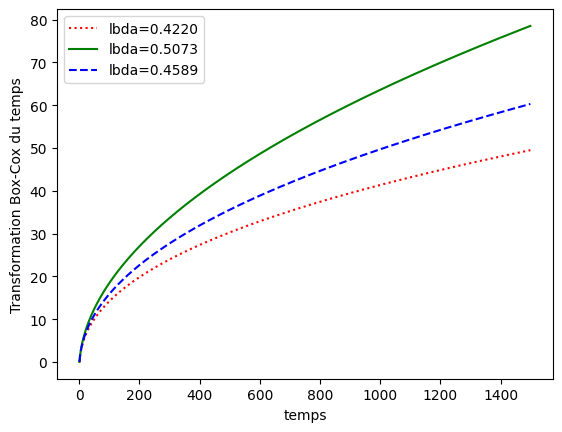

In [ ]:
x=np.arange(1, 1500,1)
plt.plot(x, stats.boxcox(x, lmbda=0.4220), ':r', label='lbda=0.4220');
plt.plot(x, stats.boxcox(x, lmbda=0.5073), '-g', label='lbda=0.5073');
plt.plot(x, stats.boxcox(x, lmbda=0.4589), '--b', label='lbda=0.4589');
plt.xlabel('temps');
plt.ylabel('Transformation Box-Cox du temps')
plt.legend();

# <font color='red'> 4) Etude des liens entre les variables de temps et les  variables explicatives</font>

Dans cette partie nous étudierons à l'aide principalement de représentations graphiques comment se comportent les variables`TurnoutTimeSeconds`,  `TravelTimeSeconds` et `TotalResponseTime` en fonction des variables explicatives de notre DataFrame qui doivent être connues *a priori*.

Nous considérons que les variables connues *a priori* correspondent aux informations qui sont connues au moment où les pompiers sont appelés pour intervenir sur l'incident à savoir :
- la date (incluant l'heure) de l'incident
- l'adresse signalée (et non forcément l'adresse exacte) de l'incident qui permet de connaître l'arrondissement, le quartier et le type de bâtiment impliqué
- la caserne de départ des pompiers
- le type d'incident à l'exception des fausses alarmes. Toutefois, nous pouvons requalifier les fausses alarmes en *suspicion d'un incendie* pour la catégorie AFA et *autres* pour les 2 autres catégories où on n'a pas de précision sur le type de fausse alarme (cela peut-être un incendie ou incident impliquant une personne)
- la distance entre la caserne et le lieu de l'incident

Certaines informations vont être connues au cours du déplacement ou après l'arrivée sur les lieux. Elles impactent sans doute le temps de réaction et/ou de trajet mais sont imprévisibles au moment du déploiement :
- l'exactitude de l'adresse (variable `AddressQualifier` et `GoodLocation`)
- l'existence d'un délai impactant le temps de réaction (problème de radio) ou le temps de trajet (trafic dense sur le réseau routier)
- le nombre d'appels reçus concernant l'incident
- le nombre de camions appelés sur l'incident et le nombre de casernes associé


Nous procédons par groupement en fonction de ce que décrivent les variables explicatives. On étudiera donc les liens entre les variables de temps et les variables :

1. temporelles, soit les variables `Year`,`HourOfCall`,`DayOfWeek`et`Month` qui sont dérivées de `DateOfCall`/`TimeOfCall`
2. géographiques, soit le lieu de l'incident (`IncGeo_BoroughName`, `IncGeo_WardName`) et la caserne depuis laquelle le camion de pompiers est mobilisé (`DeployedFromStation_Name`)
3. sur le type d'incidents `IncidentGroup` et `DetailedIncidentGroup`
4. sur la distance entre le lieu d'incident et la caserne depuis laquelle le camion est déployé
5. sur le type de propriété impliqué dans l'incident `PropertyCategory` et `HighPropertyType`
6. sur le nombre de camions disponibles au moment de l'incident `PumpCount`

Nous tenons à préciser pour la suite que :
- bien que nous étudions l'influence de chaque variable explicative sur les 3 variables de temps, la modélisation sera effectuée sur le temps total. Elle dicte donc nos conclusions.
- concernant les variables catégorielles, si l'écart entre la moyenne du temps la plus forte et la plus faible est inférieur à 5%, nous choisissons de ne pas conserver cette variable pour la modélisation.

## <font color='blue'> 4.a) Définition de méthodes utilisées ensuite </font>

In [ ]:
def graph_countIncident(df, variable):
  """
  Crée un barplot comptant le nom d'incident en fonction d'une variable catégorielle dans un DataFrame.

  Args:
      df (pandas.DataFrame): Le DataFrame contenant les données.
      variable (str): Le nom de la colonne à représenter.
  """
  df_count=df[['IncidentNumber', variable]].groupby(variable).agg(['count']).reset_index()
  plt.bar(list(df_count[variable]), list(df_count.IncidentNumber['count']));
  plt.ylabel('Nombre d\'incidents');
  plt.xlabel(variable);
  plt.title('Nombre d\'incidents pour les valeurs de ' + variable );


In [ ]:
def graphQuali_countPlot(df, variable, nom_html):
    """
    Crée un histogramme interactif de la distribution d'une variable catégorielle dans un DataFrame.

    Args:
        df (pandas.DataFrame): Le DataFrame contenant les données.
        variable (str): Le nom de la colonne à représenter.
        nom_html (str) : le nom du fichier où enregistrer la figure
    """

    fig = px.histogram(df, x=variable, nbins=30, title=f"Distribution de {variable}")

    # Personnaliser le layout
    fig.update_layout(
        # title_text=f"Boxcox des temps moyens par {variable}",
        # yaxis_title="Boxcox des temps",
        height=800,
        width=800,
        barmode='group'  # Pour grouper les barres si nécessaire
    )
    offline.plot(fig, filename=nom_html)
    fig.show()

In [ ]:
def graphQuali_boxplot(df, variable, nom_png):
    """
    Crée un boxplot de la distribution des temps (transformation Box-Cox) en fonction d'une variable catégorielle

    Args:
        df (pandas.DataFrame): Le DataFrame contenant les données.
        variable (str): Le nom de la colonne à représenter.
        nom_png (str) : nom du fichier png où le graphique est enregistré
    """
    variables = ['boxcox_TurnoutTimeSeconds', 'boxcox_TravelTimeSeconds', 'boxcox_TotalResponseTime']

    # Create a figure with 3 subplots arranged horizontally
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5));

    for i, var in enumerate(variables):
        sns.boxplot(x=variable, y=var, data=df, ax=axes[i]);
        axes[i].set_title(f"PointPlot de {var} \nen fonction de {variable}");
        axes[i].set_xlabel(variable);
        axes[i].set_ylabel(var);

    plt.tight_layout();
    plt.savefig(nom_png, dpi=300, bbox_inches="tight"); # enregistrement de la figure
    plt.show();


In [ ]:
def graphQuali_pointplot(df, variable, nom_png):
    """
    Crée un pointplot (indication de la moyenne + IC95%) des temps (transformation Box-Cox) en fonction d'une variable catégorielle

    Args:
      df (pandas.DataFrame): Le DataFrame contenant les données.
      variable (str): Le nom de la colonne à représenter.
      nom_png (str): nom du fichier png où le graphique est enregistré
    """
    variables = ['boxcox_TurnoutTimeSeconds', 'boxcox_TravelTimeSeconds', 'boxcox_TotalResponseTime']

    # Create a figure with 3 subplots arranged horizontally
    plt.figure(figsize=(15,5));


    for i, var in enumerate(variables):
      plt.subplot(1,3,i+1)
      sns.pointplot(x=variable, y=var, data=df);
      plt.title(f"Pointplot de {var} \nen fonction de {variable}");
      plt.xlabel(variable);
      plt.ylabel(var);


    plt.tight_layout();
    plt.savefig(nom_png, dpi=300, bbox_inches="tight"); # enregistrement de la figure
    plt.show()  ;


In [ ]:
def graphQuali_meanPlot(df, variable, nom_html, rest=100, nom_html2=''):
    """
    Crée un pointplot (avec uniquement la moyenne) des temps (transformation Box-Cox) en fonction d'une variable catégorielle

    Args:
    df (pandas.DataFrame): Le DataFrame contenant les données.
    variable (str): Le nom de la colonne à représenter.
    nom_html (str): nom du fichier html où le graphique est enregistré le graphiques avec les "rest" premières valeurs de variable
    nom_html2 (str): nom du fichier html où le graphique est enregistré le graphiques avec les "rest" dernières valeurs de variable
                    uniquement si rest<nb de valeurs distinctes de variables
    rest (int) : rest/2 valeurs qu'on souhaite voir afficher, rest<=nb de valeurs distinctes de variables
    """

    # Calculer les moyennes des temps par valeur de variable
    mean = df.groupby(variable).agg({
    'boxcox_TurnoutTimeSeconds': 'mean',
    'boxcox_TravelTimeSeconds': 'mean',
    'boxcox_TotalResponseTime':'mean'
    }).reset_index()

    # Créer la figure et les traces
    fig = make_subplots(rows=3, cols=1);

    # Trier par temps de réaction moyen par ordre décroissant
    mean_times_by_borough = mean.sort_values(by='boxcox_TotalResponseTime', ascending=False)

    if rest == df[variable].nunique():
      title=f"Temps moyens (transformation Box-Cox) par {variable}"
      title2=''
    else :
      title=f"Temps moyens (transformation Box-Cox) par {variable} \n({rest}) premières valeurs"
      title2=f"Temps moyens (transformation Box-Cox) par {variable} \n({rest}) dernières valeurs"


    fig.add_trace(
    go.Line(
    x=mean_times_by_borough[variable].head(rest),
    y=mean_times_by_borough['boxcox_TurnoutTimeSeconds'].head(rest),
    name='Temps de réaction',
    marker_color='blue'  # Couleur personnalisée
    ), row=1, col=1
    );


    fig.add_trace(
    go.Line(
    x=mean_times_by_borough[variable].head(rest),
    y=mean_times_by_borough['boxcox_TravelTimeSeconds'].head(rest),
    name='Temps de trajet',
    marker_color='orange'
    ), row=2, col=1
    );

    fig.add_trace(
    go.Line(
    x=mean_times_by_borough[variable].head(rest),
    y=mean_times_by_borough['boxcox_TotalResponseTime'].head(rest),
    name='Temps de total',
    marker_color='green'
    ), row=3, col=1
    );

    # Personnaliser le layout
    fig.update_layout(
    title_text=title,
    yaxis_title="Temps moyen",
    height=1200,
    width=1000,
    barmode='group'  # Pour grouper les barres si nécessaire
    );

    fig.update_xaxes(tickangle=45);
    offline.plot(fig, filename=nom_html);
    fig.show();

    if rest != df[variable].nunique():
        # Créer la figure et les traces
        fig = make_subplots(rows=3, cols=1)

        fig.add_trace(
        go.Line(
        x=mean_times_by_borough[variable].tail(rest),
        y=mean_times_by_borough['boxcox_TurnoutTimeSeconds'].tail(rest),
        name='Temps de réaction',
        marker_color='blue'  # Couleur personnalisée
        ), row=1, col=1
        );


        fig.add_trace(
        go.Line(
        x=mean_times_by_borough[variable].tail(rest),
        y=mean_times_by_borough['boxcox_TravelTimeSeconds'].tail(rest),
        name='Temps de trajet',
        marker_color='orange'
        ), row=2, col=1
        );

        fig.add_trace(
        go.Line(
        x=mean_times_by_borough[variable].tail(rest),
        y=mean_times_by_borough['boxcox_TotalResponseTime'].tail(rest),
        name='Temps total',
        marker_color='green'
        ), row=3, col=1
        );

        # Personnaliser le layout
        fig.update_layout(
        title_text=title2,
        yaxis_title="Temps moyen",
        height=1200,
        width=1000,
        barmode='group'  # Pour grouper les barres si nécessaire
        );

        fig.update_xaxes(tickangle=45);
        offline.plot(fig, filename=nom_html2);
        fig.show();



In [ ]:
def graphQuanti_meanPlot(df, variable, nom_png):
    """
      Crée un graphique avec la moyenne et IC95% des temps (transformation Box-Cox) en fonction d'une variable continue

      Args:
      df (pandas.DataFrame): Le DataFrame contenant les données.
      variable (str): Le nom de la colonne à représenter.
      nom_html (str): nom du fichier html où le graphique est enregistré
    """

    # Calculer les moyennes par arrondissement

    variables = ['boxcox_TurnoutTimeSeconds', 'boxcox_TravelTimeSeconds', 'boxcox_TotalResponseTime']

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5));

    for i, var in enumerate(variables):
      sns.lineplot(x=variable, y=var, data=df, ax=axes[i]);
      axes[i].set_title(f"Graphique de {var} \nen fonction de {variable}");
      axes[i].set_xlabel(variable);
      axes[i].set_ylabel(var);

    plt.tight_layout();
    plt.savefig(nom_png, dpi=300, bbox_inches="tight"); # enregistrement de la figure
    plt.show();


In [ ]:
def test_anova(df, variable):
    """
        Réalise un test d'ANOVA sur les 3 temps pour étudier l'influence d'une variable catégorielle sur ceux-ci

        Args:
        df (pandas.DataFrame): Le DataFrame contenant les données.
        variable (str): Le nom de la colonne à tester.
    """
    variables = ['boxcox_TurnoutTimeSeconds', 'boxcox_TravelTimeSeconds', 'boxcox_TotalResponseTime']
    for var in variables:
      modele=var+' ~' + variable
      result = ols(modele, data=df).fit()
      print('Test ANOVA pour étudier l\'effet de ', variable, 'sur ', var)
      display(sm.stats.anova_lm(result))
      print('\n')



## <font color='blue'> 4.b) Variables explicatives temporelles </font>

### <font color='orange'> 4.b.i) Heure de l'incident </font>

Sans surprise, le nombre d'incidents varient en fonction de l'heure et il y a plus d'incidents en journée que la nuit (tout comme l'activité humaine).

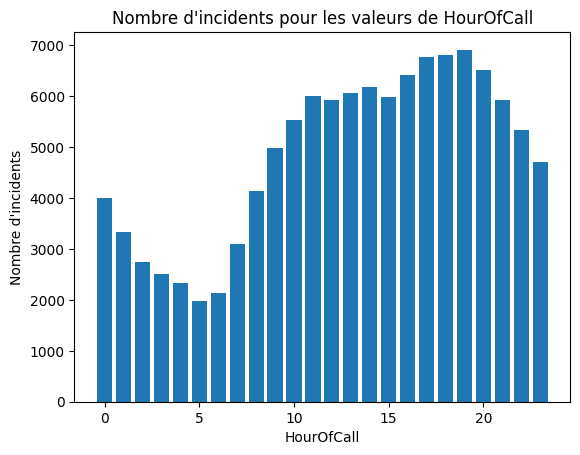

In [ ]:
graph_countIncident(df_2023, 'HourOfCall')


De même, il n'est pas surprenant de constater que
- le temps de réaction moyen augmente la nuit - spécialement entre 23h et 6h, horaire où il y a sans doute moins de pompiers dans les casernes (astreinte à domicile)
- le temps de trajet moyen augmente le jour, spécialement sur la tranche 10-18h, plage horaire où le trafic est plus dense car l'activité humaine plus intense.
- la courbe moyenne du temps total présente deux pics correspondant aux plages horaires 2-6h et 11-18h

Sur  le temps total moyen, l'écart entre la valeur la plus forte (pour `Hour=6h`) et la plus faible (pour `Hour=22h`) est de l'ordre de 6%.



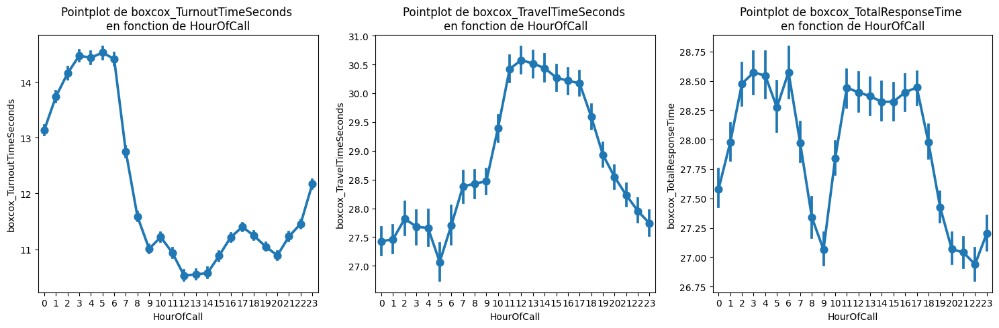

In [ ]:
# au vu du nombre de catégories, on représente les graphiques avec un catplot
# nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'
# graphQuali_boxplot(df_2023,'HourOfCall', nom_png)

nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'

graphQuali_pointplot(df_2023,'HourOfCall', nom_png)

<font color='darkgrey'> *Figure non sauvegardée* </font>

Nous avons réalisé un test d'ANOVA. L'heure de l'incident a un impact signicatif sur les 3 temps (réaction, trajet et total). De plus, l'analyse des temps moyen indique un écart de plus de 5% entre la valeur la plus faible et la plus forte.

**Nous choisissons donc d'inclure l'heure de l'incident dans la modélisation.**

In [ ]:
test_anova(df_2023, 'HourOfCall')

Test ANOVA pour étudier l'effet de  HourOfCall sur  boxcox_TurnoutTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
HourOfCall,1.0,6.251820e+04,62518.204763,6519.899491,0.0
Residual,116361.0,1.115766e+06,9.588830,NaN,NaN




Test ANOVA pour étudier l'effet de  HourOfCall sur  boxcox_TravelTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
HourOfCall,1.0,9.984904e+03,9984.904153,136.435347,1.668782e-31
Residual,116361.0,8.515780e+06,73.184145,NaN,NaN




Test ANOVA pour étudier l'effet de  HourOfCall sur  boxcox_TotalResponseTime


,df,sum_sq,mean_sq,F,PR(>F)
HourOfCall,1.0,6.394213e+03,6394.212822,195.413318,2.273840e-44
Residual,116361.0,3.807504e+06,32.721479,NaN,NaN


#### Heure exacte (h:min:sec) de l'incident

Au vu de l'impact de la variable catégorielle `HourOfCall`, nous avons analysé les temps selon la variable `TimeOfCall` qui est une variable quantitative bornée.

In [ ]:
# fonction pour transformer l'heure en un entier
def time_to_decimal(time_str):
    # Diviser l'heure en heures, minutes et secondes
    heures, minutes, secondes = map(int, time_str.split(':'))
    # Calculer la version décimale
    heure_decimal = heures + minutes / 60 + secondes / 3600
    # Arrondir à une décimale pour obtenir un résultat tel que a,b.
    return round(heure_decimal, 1)

In [ ]:
# Exemple d'utilisation
time_str = "13:30:00"
print(time_to_decimal(time_str))  # 13.5

# application à TimeOfCall
df_2023['TimeOfCallFormat']=(df_2023.TimeOfCall.astype('str')).apply(lambda x: time_to_decimal(x))


13.5


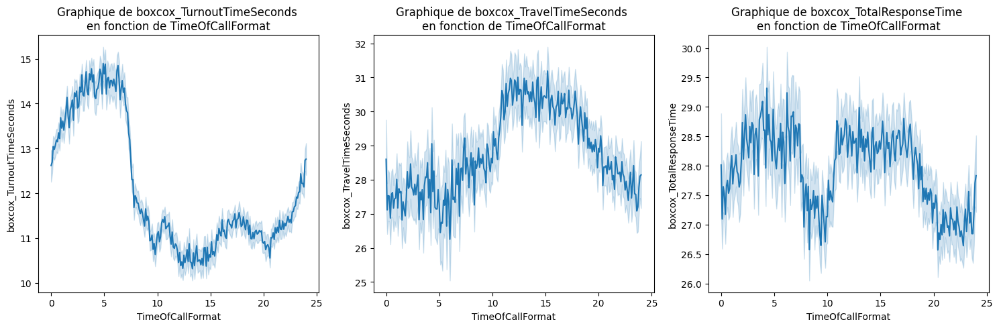

In [ ]:
nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'
graphQuanti_meanPlot(df_2023, 'TimeOfCallFormat', nom_png)

Sans surprise, on observe les même tendance avec la variable continue bornée `TimeOfCall` que sur la variable catégorielle `HourOfCall`:
- le temps de réaction moyen augmente la nuit - spécialement entre 23h et 6h, horaire où il y a sans doute moins de pompiers dans les casernes (astreinte à domicile)
- le temps de trajet moyen augmente le jour, spécialement sur la tranche 10-18h, plage horaire où le trafic est plus dense car l'activité humaine plus intense.
- la courbe moyenne du temps total présente deux pics correspondant aux 2 plages horaires précédentes
</br></br>

*Nota Bene* :
- Il n'est pas possible d'inclure dans la modélisation `TimeOfCall` et `HourOfCall`, puisque ces deux variables indiquent une information similaire
- Bien que nous ayons considéré `TimeOfCall` comme une variable continue au vu du nombre valeurs possibles (86400, le nombre de secondes dans une journée), elle reflète une  position par rapport à une heure de référence (00:00:00) plutôt qu'une mesure.


**`TimeOfCall` ne sera pas inclus dans la modélisation**

### <font color='orange'>4.b.ii) jour de l'incident </font>

Le nombre d'incidents selon le jour de la semaine est très similaire, comme le montre le graphique suivant.

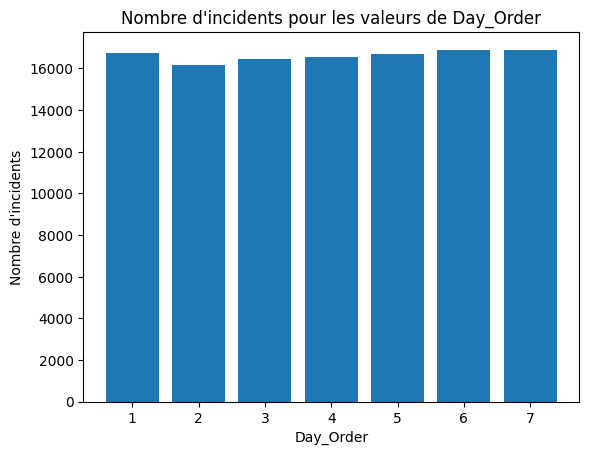

In [ ]:
# Créer un dictionnaire pour mapper les valeurs numériques des mois vers les noms de mois
days_mapping = {'Monday':1, 'Tuesday':2, 'Wednesday':3, 'Thursday':4, 'Friday':5 , 'Saturday':6, 'Sunday':7}

# Créer une nouvelle colonne 'Day_Order' en utilisant le dictionnaire
df_2023['Day_Order'] = df_2023['DayOfWeek'].map(days_mapping)

graph_countIncident(df_2023, 'Day_Order')

Le temps de réaction moyen semble lègèrement plus court du mercredi au vendredi alors que le temps de trajet et le temps total moyens sont plus courts le dimanche.
L'écart entre le temps total moyen le plus long (le vendredi) et le plus court (le jeudi) est de l'ordre de 2%.  

**Comme indiqué en introduction de cette section, puisque l'écart est de moins de 5%, nous choisissons de ne pas inclure le jour de la semaine dans la modélisation.**

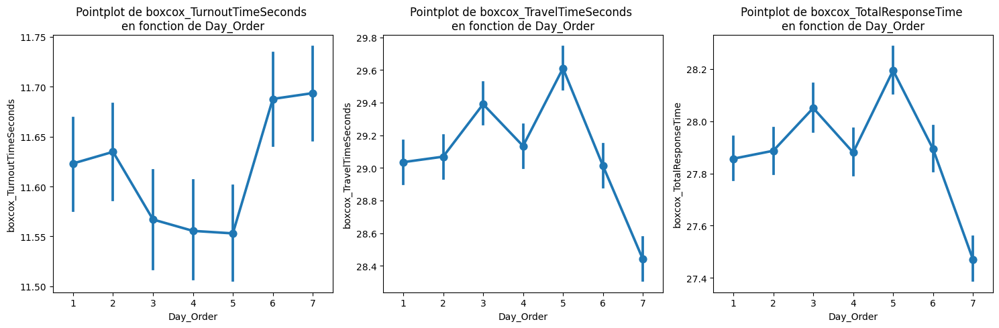

In [ ]:
nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'

graphQuali_pointplot(df_2023,'Day_Order', nom_png)

<font color='darkgrey'> *Figure non sauvegardée* </font>

### <font color='orange'>4.b.iii) Mois de l'incident </font>

Il semble y avoir une légère saisonnalité sur le nombre d'incidents, avec un nombre plus important sur le second semestre, à l'exception d'août.

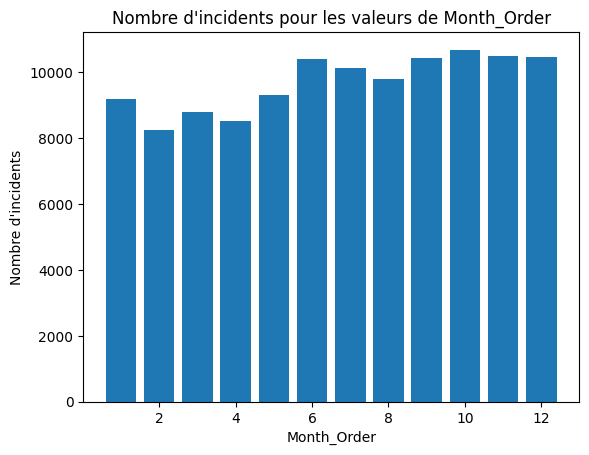

In [ ]:
# Créer un dictionnaire pour mapper les valeurs numériques des mois vers les noms de mois
month_mapping = {'January':1, 'February':2, 'March':3, 'April':4, 'May':5 , 'June':6, 'July':7, 'August':8,'September':9,'October':10,'November':11, 'December':12}

# Créer une nouvelle colonne 'Month_Order' en utilisant le dictionnaire
df_2023['Month_Order'] = df_2023['Month'].map(month_mapping)

graph_countIncident(df_2023, 'Month_Order')

On constate une influence du mois de l'incident sur les différents temps mais les variations sont faibles. Ainsi, l'écart entre le temps total moyen le plus long (en novembre) et le plus court (en avril) est de l'ordre de 3%.

**Puisque l'écart est de moins de 5%, nous choisissons de ne pas inclure le mois dans la modélisation.**

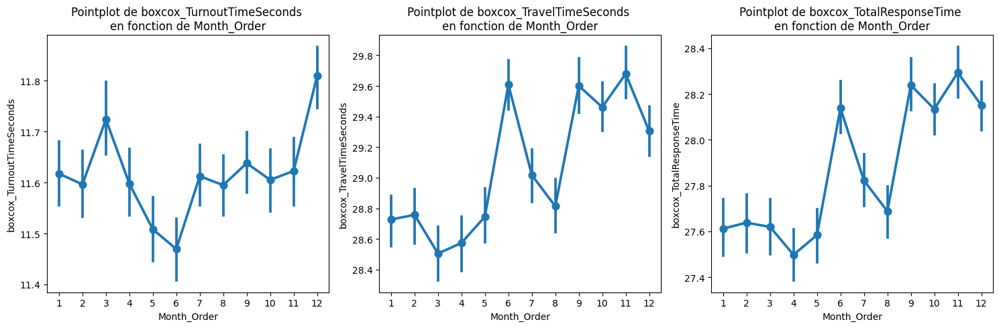

In [ ]:
nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'

graphQuali_pointplot(df_2023,'Month_Order', nom_png)

<font color='darkgrey'> *Figure non sauvegardée* </font>

## <font color='blue'> 4.c) Variables explicatives géographiques </font>

### <font color='orange'>4.c.i) Arrondissement (Borough) </font>

Le nombre d'incident par arrondissement est hétérogène. Ainsi, il y a eu
8187 incidents à *Westminster* en 2023 contre 1066 à *City of London*, soit 10 fois moins.

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_countPlot(df_2023, 'IncGeo_BoroughName', nom_html)

<font color='darkgrey'> *Figure non sauvegardée* </font>

Le graphique suivant est l'équivalent d'un PointPlot sauf que seule la moyenne des temps apparaît pour chaque valeur de `IncGeo_BoroughName`. Les arrondissements sont classés par ordre décroissant selon la valeur moyenne du temps total de réponse.

La moyenne de `TotalResponseTime` varie entre  25,7 à 30,1 soit une différence de 15% environ. Cet écart est un peu plus important pour `TravelTimeSeconds` (20%) et moins pour `TurnoutTimeSeconds` (10%).

On peut donc supposer que l'arrondissement où a lieu l'incident a un impact sur les temps (réaction, trajet, total).

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_meanPlot(df_2023, 'IncGeo_BoroughName', nom_html, rest=df_2023['IncGeo_BoroughName'].nunique())

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




<font color='darkgrey'> *Figure non sauvegardée* </font>

Nous avons réalisé un test d'ANOVA. L'arrondissement de l'incident a un impact signicatif sur les 3 temps.

In [ ]:
test_anova(df_2023, 'IncGeo_BoroughName')


Test ANOVA pour étudier l'effet de  IncGeo_BoroughName sur  boxcox_TurnoutTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
IncGeo_BoroughName,32.0,1.153962e+04,360.613244,35.954867,4.143088e-220
Residual,116330.0,1.166744e+06,10.029609,NaN,NaN




Test ANOVA pour étudier l'effet de  IncGeo_BoroughName sur  boxcox_TravelTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
IncGeo_BoroughName,32.0,3.019890e+05,9437.156194,133.493952,0.0
Residual,116330.0,8.223776e+06,70.693511,NaN,NaN




Test ANOVA pour étudier l'effet de  IncGeo_BoroughName sur  boxcox_TotalResponseTime


,df,sum_sq,mean_sq,F,PR(>F)
IncGeo_BoroughName,32.0,1.452722e+05,4539.756184,143.95303,0.0
Residual,116330.0,3.668626e+06,31.536371,NaN,NaN


###<font color='orange'>4.c.ii) Quartier (Ward) </font>

Les quartiers (Wards) étant une division plus fine des arrondissements (Boroughs), il est attendu que le nombre d'incidents soit hétérogène. C'est bien le cas, avec un nombre particulièremnt important pour *West End* et *St James's*, avec plus de 1400 incidents chacun sur 2023. Pour les autres quartiers, le nombre d'intervention est inférieur à 800.

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_countPlot(df_2023, 'IncGeo_WardName', nom_html)

<font color='darkgrey'> *Figure non sauvegardée* </font>


Le dataFrame contient plus de 600 quartiers différents ; nous décidons donc de ne représenter 200 d'entre eux, correspondant aux 100 premiers/derniers pour lesquels la moyenne de `TotalResponseTime` est la plus forte/faible.

Pour `TotalResponseTime`, il y a une différence de l'ordre de 40% entre *Darwin* (temps moyen=36,1) et *Norbury & Pollards Hill* (21,3).

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'
nom_html2='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'
graphQuali_meanPlot(df_2023, 'IncGeo_WardName', nom_html, rest=100, nom_html2=nom_html2)

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




<font color='darkgrey'> *Figures non sauvegardées* </font>

Les tests d'ANOVA réalisés sur le quartier sont significatifs.

In [ ]:
test_anova(df_2023, 'IncGeo_WardName')

Test ANOVA pour étudier l'effet de  IncGeo_WardName sur  boxcox_TurnoutTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
IncGeo_WardName,692.0,3.217075e+04,46.489518,4.690825,2.694288e-319
Residual,115474.0,1.144432e+06,9.910733,NaN,NaN




Test ANOVA pour étudier l'effet de  IncGeo_WardName sur  boxcox_TravelTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
IncGeo_WardName,692.0,1.484213e+06,2144.816173,35.248046,0.0
Residual,115474.0,7.026503e+06,60.849223,NaN,NaN




Test ANOVA pour étudier l'effet de  IncGeo_WardName sur  boxcox_TotalResponseTime


,df,sum_sq,mean_sq,F,PR(>F)
IncGeo_WardName,692.0,6.672677e+05,964.259724,35.464795,0.0
Residual,115474.0,3.139647e+06,27.189209,NaN,NaN


**Nous inclurons uniquement l'arrondissement dans la première étape de la modélisation** car
- arrondissement et quartier fournissent une information similaire sur une échelle différente
-  nous souhaitons éviter de décupler le nombre de variables catégorielles et il y a déjà 33 arrondissements différents (et donc 33 variables une fois binarisée)
- nous pourrons comparer l'impact des arrondissements versus des quartiers dans une seconde étape, après avoir choisi le type de modèle à utiliser

### <font color='orange'>4.c.iii) Caserne de départ </font>

Le nombre d'incident en fonction de la caserne de départ du camion est hétérogène. Cela semble cohérent avec l'hétérogénéité des incidents par arrondissement/quartier.

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_countPlot(df_2023, 'DeployedFromStation_Name', nom_html)

<font color='darkgrey'> *Figure non sauvegardée* </font>

Les temps moyens varient en fonction de la caserne de départ. La différence entre la moyenne la plus forte et la plus faible est de l'ordre de 20% pour le temps de réaction, le temps de trajet et le temps total.

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_meanPlot(df_2023, 'DeployedFromStation_Name', nom_html, rest=df_2023['DeployedFromStation_Name'].nunique())

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




<font color='darkgrey'> *Figure non sauvegardée* </font>

Les tests d'ANOVA réalisés sur la caserne de départ sont significatifs.

**Nous inclurons la caserne dans la modélisation.**

In [ ]:
test_anova(df_2023, 'DeployedFromStation_Name')

Test ANOVA pour étudier l'effet de  DeployedFromStation_Name sur  boxcox_TurnoutTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
DeployedFromStation_Name,101.0,3.492336e+04,345.775839,35.159724,0.0
Residual,116261.0,1.143361e+06,9.834430,NaN,NaN




Test ANOVA pour étudier l'effet de  DeployedFromStation_Name sur  boxcox_TravelTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
DeployedFromStation_Name,101.0,3.321043e+05,3288.161593,46.656185,0.0
Residual,116261.0,8.193661e+06,70.476435,NaN,NaN




Test ANOVA pour étudier l'effet de  DeployedFromStation_Name sur  boxcox_TotalResponseTime


,df,sum_sq,mean_sq,F,PR(>F)
DeployedFromStation_Name,101.0,1.690566e+05,1673.828064,53.390776,0.0
Residual,116261.0,3.644842e+06,31.350510,NaN,NaN


#### Type de caserne (`FromHomeStation`)

Dans 96% des incidents, la caserne de départ correspond à la caserne de stationnement du camion de pompiers

In [ ]:
df_2023['FromHomeStation'].value_counts(normalize=True)

,proportion
FromHomeStation,
1,0.957822
0,0.042178


Si les figures suivantes indiquent des distributions de temps différentes en fonction de la valeur de `FromHomeStation`, l'écart sur la moyenne est de l'ordre de 1%.

**Cette variable ne sera donc pas incluse dans la modélisation.**

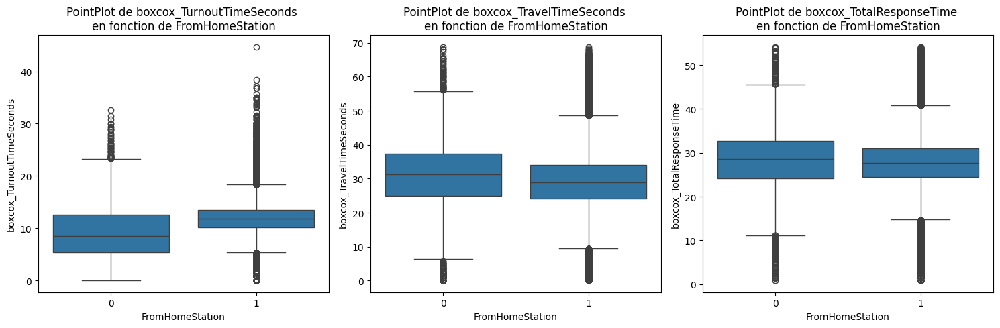

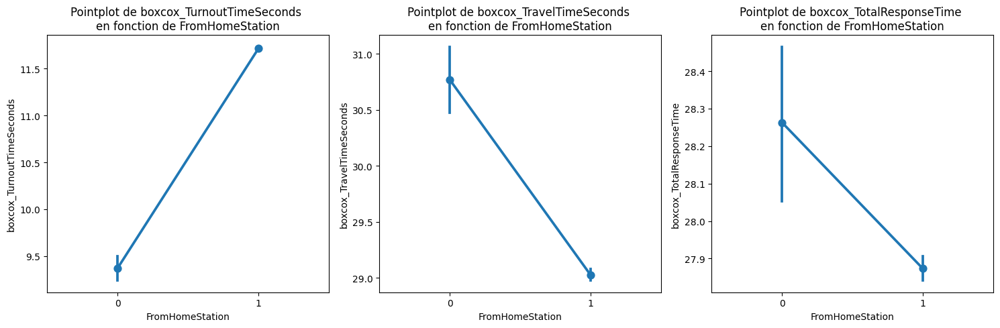

In [ ]:
nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'
graphQuali_boxplot(df_2023,'FromHomeStation', nom_png)


nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'

graphQuali_pointplot(df_2023,'FromHomeStation', nom_png)

<font color='darkgrey'> *Figures non sauvegardées* </font>

## <font color='blue'> 4.d) Variables explicatives sur le type d'incident </font>

### <font color='orange'>4.d.i) Type d'incident </font>

Les fausses alarmes sont les incidents majoritaires en 2023. Nous avons vu dans le notebook précédent que c'est valable sur l'ensemble des années.

In [ ]:
df_2023['IncidentGroup'].value_counts(normalize=True)

,proportion
IncidentGroup,
False Alarm,0.522993
Special Service,0.346837
Fire,0.130170


Les graphiques suivants montrent que la distribution des temps (réaction, trajet et total) est similaire selon le type d'incident. Sur le temps total moyen, il y a moins de 3% d'écart entre le temps le plus long (`IncidentGroup`=`Special Service`) et le plus cours (`False Alarm`)



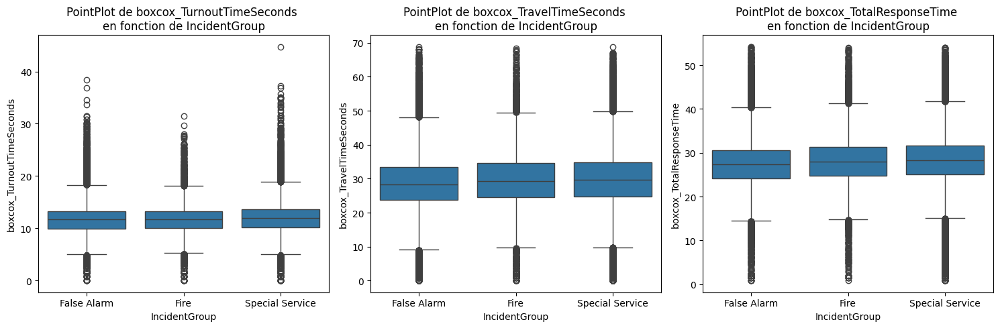

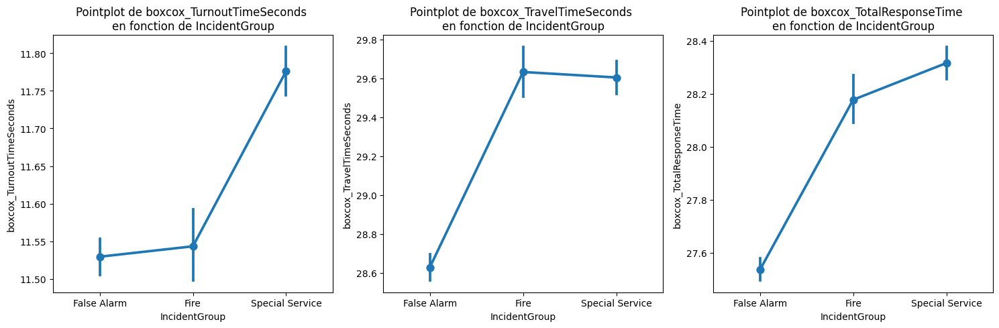

In [ ]:
nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'

graphQuali_boxplot(df_2023, 'IncidentGroup',nom_png)


nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.png'
graphQuali_pointplot(df_2023,'IncidentGroup', nom_png)

<font color='darkgrey'> *Figure non sauvegardée* </font>

### <font color='orange'>4.d.i) Type d'incident détaillé </font>

Il existe une seconde variable indiquant le type d'incident : `DetailedIncidentGroup`. Elle est plus détaillée que `IncidentGroup`, avec 27 catégories différentes (chacune n'appartenant qu'à une seule catégorie de `IncidentGroup`). La répartition de `DetailedIncidentGroup` est hétérogène.

Un peu plus de 40% des incidents sont une fausse alarme du type AFA (automatic fire alarm). Les cinq catégories suivantes relèvent d'un autre type de fausse alarme, d'un 1er ou 2nd feu, d'une inondation (flooding) ou d'une gestion d'entrée/sortie de personnes.

In [ ]:
# df_2023[['DetailedIncidentGroup']].value_counts(normalize=True)
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_countPlot(df_2023, 'DetailedIncidentGroup', nom_html)

<font color='darkgrey'> *Figure non sauvegardée* </font>

Les temps moyens varient en fonction du type d'incident détaillé. La différence entre la moyenne la plus forte et la plus faible est de l'ordre de 40% pour le temps de réaction, le temps de trajet et le temps total.


In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_meanPlot(df_2023, 'DetailedIncidentGroup', nom_html, rest=df_2023['DetailedIncidentGroup'].nunique())


/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




<font color='darkgrey'> *Figure non sauvegardée* </font>

Les tests d'ANOVA réalisés sur le type détaillé sont significatifs.

Sachant que
- `IncidentGroup` et `DetailedIncidentGroup` fournissent le même type d'information avec un niveau de détails différent
- l'écart entre le temps total moyen le plus long et le plus court est de l'ordre de 3% pour `IncidentGroup` et 40% pour `DetailedIncidentGroup`
- le nombre de catégories du type d'incident détaillé est raisonnable
- on ne peut pas utiliser le type fausse alarme qui est connu *a posteriori* alors que nous pouvons requalifier les fausses alarmes en *suspicion d'un incendie*

**Nous inclurons donc le type détaillé d'incident dans la modélisation** après requalification des fausses alarmes.

In [ ]:
test_anova(df_2023, 'DetailedIncidentGroup')

Test ANOVA pour étudier l'effet de  DetailedIncidentGroup sur  boxcox_TurnoutTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
DetailedIncidentGroup,26.0,7.861124e+03,302.350913,30.052639,1.977001e-147
Residual,116336.0,1.170423e+06,10.060711,NaN,NaN




Test ANOVA pour étudier l'effet de  DetailedIncidentGroup sur  boxcox_TravelTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
DetailedIncidentGroup,26.0,1.550585e+05,5963.787343,82.884658,0.0
Residual,116336.0,8.370707e+06,71.952849,NaN,NaN




Test ANOVA pour étudier l'effet de  DetailedIncidentGroup sur  boxcox_TotalResponseTime


,df,sum_sq,mean_sq,F,PR(>F)
DetailedIncidentGroup,26.0,8.412605e+04,3235.617211,100.922722,0.0
Residual,116336.0,3.729772e+06,32.060344,NaN,NaN


## <font color='blue'> 4.e) Variables sur le type de propriété </font>

### <font color='orange'>4.f.i) Type de propriété impacté par l'incident </font>

Plus de 50% des incidents ont lieu dans un bâtiment d'habitation (`Dwelling`) et 20% dans un bâtiment non résidentiel.

In [ ]:
# df_2023['PropertyCategory'].value_counts(normalize=True)
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_countPlot(df_2023, 'PropertyCategory', nom_html)

<font color='darkgrey'> *Figure non sauvegardée* </font>

Les temps moyens varient en fonction du type de propriété impacté. La différence entre la moyenne la plus forte et la plus faible est de l'ordre de 10% pour le temps de réaction, le temps de trajet et le temps total.

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_meanPlot(df_2023, 'PropertyCategory', nom_html, rest=df_2023['PropertyCategory'].nunique())

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




<font color='darkgrey'> *Figure non sauvegardée* </font>

Les tests d'ANOVA sont significatifs.

In [ ]:
test_anova(df_2023, 'PropertyCategory')

Test ANOVA pour étudier l'effet de  PropertyCategory sur  boxcox_TurnoutTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
PropertyCategory,8.0,1.162841e+03,145.355087,14.367804,3.755839e-21
Residual,116354.0,1.177121e+06,10.116723,NaN,NaN




Test ANOVA pour étudier l'effet de  PropertyCategory sur  boxcox_TravelTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
PropertyCategory,8.0,4.785729e+04,5982.160707,82.101426,3.499654e-136
Residual,116354.0,8.477908e+06,72.863055,NaN,NaN




Test ANOVA pour étudier l'effet de  PropertyCategory sur  boxcox_TotalResponseTime


,df,sum_sq,mean_sq,F,PR(>F)
PropertyCategory,8.0,2.414550e+04,3018.187892,92.66521,2.875767e-154
Residual,116354.0,3.789753e+06,32.570885,NaN,NaN


### <font color='orange'>4.f.ii) Type de propriété  détaillé </font>

Il existe une variable, `HighPropertyType`,  détaillant plus finement le type de propriété impacté par l'incident ; chaque catégorie de `HighPropertyType` appartient à une seule catégorie de `PropertyCategory`. Il est donc cohérent de voir que plus de 60% des incidents ont lieu dans un immeuble d'habitation (catégorie majoritaire parmi les bâtiments d'habitation).

In [ ]:
# df_2023['HighPropertyType'].value_counts(normalize=True)
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_countPlot(df_2023, 'HighPropertyType', nom_html)

<font color='darkgrey'> *Figure non sauvegardée* </font>

Les temps moyens varient en fonction du type d'incident détaillé. La différence entre la moyenne la plus forte et la plus faible est supérieur à 15% pour le temps de réaction, le temps de trajet et le temps total.

In [ ]:
nom_html='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/000_delete.html'

graphQuali_meanPlot(df_2023, 'HighPropertyType', nom_html, rest=df_2023['HighPropertyType'].nunique())

/usr/local/lib/python3.10/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




<font color='darkgrey'> *Figure non sauvegardée* </font>

**Nous inclurons `PropertyCategory` uniquement  dans la première étape de la modélisation** car
- `PropertyCategory` et `HighPropertyType` fournissent une information similaire sur une échelle différente
-  nous souhaitons éviter de décupler le nombre de variables catégorielles et il y a 5 fois moins de catégories pour `PropertyCategory` ( 9 versus 47)
- nous pourrons comparer l'impact de ces deux variables dans une seconde étape, après avoir choisi le type de modèle à utiliser

In [ ]:
test_anova(df_2023, 'HighPropertyType')

Test ANOVA pour étudier l'effet de  HighPropertyType sur  boxcox_TurnoutTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
HighPropertyType,46.0,5.410938e+03,117.629095,11.665496,1.312193e-84
Residual,116316.0,1.172873e+06,10.083506,NaN,NaN




Test ANOVA pour étudier l'effet de  HighPropertyType sur  boxcox_TravelTimeSeconds


,df,sum_sq,mean_sq,F,PR(>F)
HighPropertyType,46.0,1.657014e+05,3602.203726,50.118509,0.0
Residual,116316.0,8.360064e+06,71.873721,NaN,NaN




Test ANOVA pour étudier l'effet de  HighPropertyType sur  boxcox_TotalResponseTime


,df,sum_sq,mean_sq,F,PR(>F)
HighPropertyType,46.0,8.448089e+04,1836.541011,57.279484,0.0
Residual,116316.0,3.729417e+06,32.062806,NaN,NaN


## <font color='blue'> 4.f) Distance </font>

La distance est la seule variable explicative quantitative de notre jeu de données. Elle varie de 0,6 mètre à 18,8 kilomètres. Sa distribution est asymétrique à droite, 50% des valeurs étant comprise entre 0.87 et 2,2 kilomètres.

In [ ]:
df_2023['distance'].describe()

,distance
count,116363.000000
mean,1787.831286
std,1784.397033
min,0.628000
25%,879.206000
50%,1450.281000
75%,2171.516000
max,18771.240000


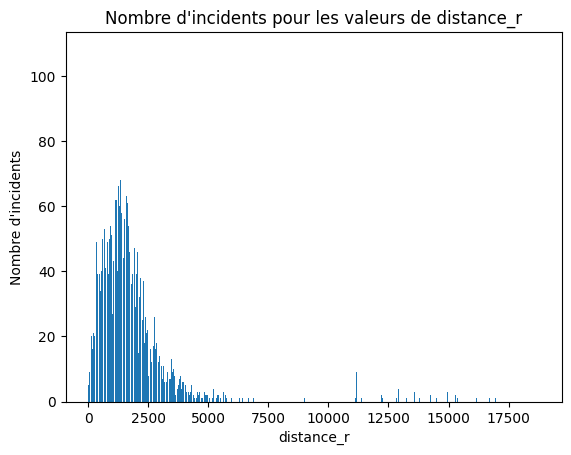

In [ ]:
df_2023['distance_r']=np.round(df_2023.distance,0) # on calcule la distance arrondie au mètre pour limiter le nombre de valeurs dans les graphiques suivants
graph_countIncident(df_2023, 'distance_r')

Le temps de réaction  moyen n'est pas influencé par la distance de l'incident. Ce constat est logique puisque le temps de réaction indique le temps nécessaire pour que le camion quitte la caserne, une fois l'incident notifié. On observe une tendance concernant le temps de trajet et par conséquent le temps total : le temps de trajet augmente avec la distance (rien de surprenant).

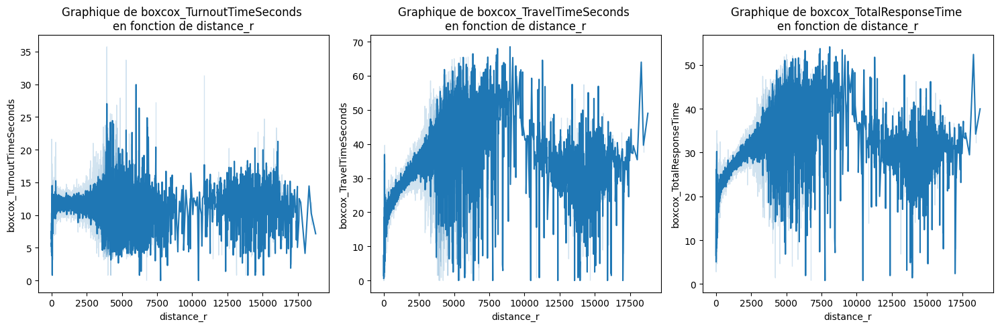

In [ ]:
nom_png='/content/gdrive/My Drive/1_Rendu/StatsResults/IMG/012_meanPlot_distance.png'
graphQuanti_meanPlot(df_2023, 'distance_r', nom_png)


<font color='darkgrey'> *Figure sauvegardée dans le fichier png "012_meanPlot_distance.png" du dossier*</font> [ IMG](https://drive.google.com/drive/folders/1DvLG3Mo2JOZsiTmjYNYzK8krzJNJ5rJt)

Nous avons calculé les corrélations linéaires (Pearson) ,  monotones (Spearman) et de rang (Pearson). Les plus fortes sont obtenues avec la méthode de Spearman. Pour le temps de réponse total, cette corrélation est de 0,66.

*Nota Bene* : la methode de Spearman est non paramétrique; elle ne fait pas d'hypothèse de normalité sur les variables. Compte tenu de la distribution de la distance (voir figure ci-dessus), cette méthode est plus adaptée que Pearson (hypothèse de normalité)

In [ ]:
cor_pearson = (df_2023[['boxcox_TurnoutTimeSeconds', 'boxcox_TravelTimeSeconds','boxcox_TotalResponseTime', 'distance']].corr().iloc[:3, 3]).reset_index()
cor_spearman = (df_2023[['boxcox_TurnoutTimeSeconds', 'boxcox_TravelTimeSeconds','boxcox_TotalResponseTime', 'distance']].corr(method='spearman').iloc[:3, 3]).reset_index()
cor_kendall = (df_2023[['boxcox_TurnoutTimeSeconds', 'boxcox_TravelTimeSeconds','boxcox_TotalResponseTime', 'distance']].corr(method='kendall').iloc[:3, 3]).reset_index()

cor_pearson['type']='pearson'
cor_spearman['type']='spearman'
cor_kendall['type']='kendall'

correlation = pd.concat([cor_pearson, cor_spearman, cor_kendall]).sort_values(by=['index','type'])
correlation


,index,distance,type
2,boxcox_TotalResponseTime,0.492737,kendall
2,boxcox_TotalResponseTime,0.357454,pearson
2,boxcox_TotalResponseTime,0.661392,spearman
1,boxcox_TravelTimeSeconds,0.505522,kendall
1,boxcox_TravelTimeSeconds,0.361005,pearson
1,boxcox_TravelTimeSeconds,0.673782,spearman
0,boxcox_TurnoutTimeSeconds,-0.010036,kendall
0,boxcox_TurnoutTimeSeconds,-0.007031,pearson
0,boxcox_TurnoutTimeSeconds,-0.014935,spearman


Les trois tests de corrélation de Spearman sont significatifs.

**Nous inclurons la distance comme variable explicative continue dans la modélisation.**

In [ ]:
display(spearmanr(df_2023.boxcox_TurnoutTimeSeconds, df_2023.distance_r))
display(spearmanr(df_2023.boxcox_TravelTimeSeconds, df_2023.distance_r))
display(spearmanr(df_2023.boxcox_TotalResponseTime, df_2023.distance_r))

SignificanceResult(statistic=-0.014935016805184623, pvalue=3.489888947423927e-07)

SignificanceResult(statistic=0.6737804552765826, pvalue=0.0)

SignificanceResult(statistic=0.6613906857294471, pvalue=0.0)

## <font color='blue'>4.g) Résumé </font>

Suite aux analyses effectuées sur les variables explicatives connues *a priori*, nous incluerons dans le modèle
- l'heure de l'incident, `HourOfCall`
- l'arrondissement, `IncGeo_BoroughName` (le quartier, `IncGeo_WardName`,  pourra être étudié dans un second temps)
- la caserne de départ, `DeployedFromStation_Name`
- le type d'incident détaillé, `DetailedIncidentGroup` (après regroupement des catégories *False alarm Malicious* / *Good intent* dans une catégorie *Other*)
- le type de propriété impacté dans l'incident, `PropertyCategory` (le type détaillé `HighPropertyType` pourra être étudié dans un second temps)
- la distance
</br></br>

*Nota Bene* :
</br>
En plus des variables connues *a posteriori* (exactitude de l'adresse, délai, nombre d'appels et nombre de camions appelés sur l'incident), les variables suivantes de `df_2023` n'ont pas fait l'objet d'une analyse
- les dates permettant le calcul du temps de trajet et de réponse : `DateAndTimeMobilised`, `DateAndTimeMobile` et `DateAndTimeArrived`
- les variables ayant permis le calcul de la distance : `Latitude`, `Longitude`, `Easting_rounded`, `Northing_rounded`, `Lat_station` et `Long_station`
- la date exacte de l'incident (`DateOfCall`). Nous avons étudié des variables dérivées comme le jour de la semaine ou le mois et nous avons supposé que l'année n'avait pas d'impact sur le temps de réponse (hypothèse soutenue par nos travaux dans la section 3)
- les variables `IncidentStationGround`, `PumpCount`, `ResourceMobilisationId` et `Resource_Code`. Nous avons un doute sur leur définition et sommes en attente d'un retour à ce sujet (note du 15/11/2024). Si notre compréhension est correct, nous ne pensons pas qu'elles puissent avoir un impact sur le temps de réponse.
- la variable `PropertyType` dont `HighPropertyType` est un regroupement

